In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mdtraj as md
from scipy.optimize import curve_fit
import sys
import seaborn as sns
import math
output_path='./PRE_analyses/'


# find if existing numpy files exist (i.e., this one has been run and saved)
def find_npy_filenames(path_to_dir, suffix=".npy"):
    filenames = os.listdir(path_to_dir)
    return [filename for filename in filenames if filename.endswith(suffix)]

def find_fasta_filenames(path_to_dir, suffix=".fasta"):
    filenames = os.listdir(path_to_dir)
    return [filename for filename in filenames if filename.endswith(suffix)]

def find_dat_filenames(path_to_dir, suffix=".dat"):
    filenames = os.listdir(path_to_dir)
    return [filename for filename in filenames if filename.endswith(suffix)]

# constants for PRE calculations
k = 1.23e16 # Å^6 s^-2
tau_t = 0.5e-9 # s
delay_hsqc = 0.010 # 10 ms
delay_hmqc = 0.01086 # 10.86 ms
r2h_hsqc = 10.0 # s-1
r2h_hmqc = 50.0 # s-1
r2mq_hmqc = 50.0 # s-1

# function to calculate PRE rates from distances
def calc_gamma2(r3, r6, angular, wh: float, tau_c: float, tau_t: float):
    s_pre = np.power(r3, 2)/r6*angular
    wh = 2*np.pi*1e6*wh
    j = lambda w : s_pre*tau_c / (1+(w*tau_c)**2) + (1-s_pre)*tau_t / (1+(w*tau_t)**2)
    return k*r6*(4*j(0) + 3*j(wh))

# function to calculate PRE intensity ratios from rates
def calc_hsqc_I(avg_gamma2, delay, r2h):

    return np.exp(-delay * avg_gamma2) * ( r2h / (r2h + avg_gamma2))

# function to calculate PRE intensity ratios from rates for HMQC experiments
def calc_hmqc_I(avg_gamma2, delay, r2h, r2mq):

    return np.exp(-delay * avg_gamma2) * ( r2h / (r2h + avg_gamma2)) * ( r2mq / (r2mq + avg_gamma2)) 

# function to calculate RMSE
def RMSE(gen_arr, exp_arr):

    gen_arr = np.array(gen_arr)
    exp_arr = np.array(exp_arr)
    exp_arr = np.minimum(float(1.0), exp_arr) # do not penalise for experimental intensities above 1 (not physically possible)
    
    return np.sqrt(np.mean((gen_arr-exp_arr)**2))

# function to do tauc scanning and return final data with PRE intensities and RMSE values for all prior ensembles
def PREanalysis_prior(model: str, protein: str, tauc_values, input_root: str, exp_root: str):

    # find either SAXS or CS weights to get the unphysical conformations (nan weights)
    try:
        saxsrew = np.load(input_root+f"{model}/{protein}/SAXSrew.npy",allow_pickle=True).item()
        weights_nan = saxsrew['weights']
    except:
        csrew = np.load(input_root+f"{model}/{protein}/CSrew_Sparta+.npy",allow_pickle=True).item()
        weights_nan = csrew['weights']

    # load experimental data
    PRE_data_files = []
    files = find_dat_filenames(exp_root+f"{protein}/")
    for file in files:
        if 'PRE' in file:
            PRE_data_files.append(file)

    alldicts = [] # list to store all datadicts corresponding to analyses with different tauc values
    rmse_prior_values = []
    for tauc in tauc_values:

        datadict = {}
        sites = []
        for file in PRE_data_files:
            site = int(file.split('-')[-1].split('.')[0])
            sites.append(site)
            datadict[site] = {}

            # get magnetic field strength from info file
            info = pd.read_csv(exp_root+f"{protein}/info.csv")
            info = info[info['Experiment']==file[:-4]]
            wh_exp = np.mean(info['PRE_MHz'])

            # determine the type of PRE: rates, hsqc intensities, hmqc intensities
            if 'PRE-I-HMQC' in file:
                datadict[site]['type'] = 'HMQC'
            elif 'PRE-I' in file:
                datadict[site]['type'] = 'HSQC'
            elif 'PRE-' in file:
                datadict[site]['type'] = 'gamma2'

            # load the data and remove nan rows and the labelling site residue if present
            data = np.loadtxt(exp_root+f"{protein}/{file}")
            mask = ~np.isnan(data).any(axis=1)
            data = data[mask]
            data = data[np.where(data[:,0]!=site)[0]]
            datadict[site]['Residue'] = data[:,0].astype(int)

            # if the data are PRE rates convert to HSQC intensities to standardise the analysis
            if datadict[site]['type'] == 'gamma2':
                EXP = calc_hsqc_I(data[:,1][np.where(data[:,0]!=1)[0]] , delay = delay_hsqc, r2h = r2h_hsqc) # excluding the first residue
                datadict[site]['I_exp'] = EXP
            else:
                EXP = data[:,1][np.where(data[:,0]!=1)[0]] # excluding the first residue
                datadict[site]['I_exp'] = EXP

            # load and average the generated PRE data
            gendata = np.load(input_root+f"{model}/{protein}/PREdata-{site}.npy",allow_pickle=True).item()
            gen_residues = gendata['Residue'].astype(int)
            gen_res_idxs = []
            for ele in datadict[site]['Residue']:
                if ele in gen_residues:
                    gen_res_idxs.append(list(gen_residues).index(ele)) 
        
            # calculate gamma2 with tauc
            gamma2 = calc_gamma2(gendata['r3'], gendata['r6'], gendata['angular'], wh = wh_exp, tau_c = tauc, tau_t = tau_t)
            mask = ~np.isnan(gamma2).any(axis=1)
            gamma2 = gamma2[mask] # filter calculated PREs for nan values where no spin-label could be fit
            w_current = weights_nan[mask] # filter calculated PREs for nan values where no spin-label could be fit
            w_nan_current = weights_nan[mask] # filter calculated PREs for nan values where no spin-label could be fit
            if len(w_current)==0: 
                    print(f'Skipping residue {site} labelling, no rotamers accomdated in the ensemble')
                    continue
            prior_gamma2 = np.average(gamma2[~np.isnan(w_nan_current), :], axis=0) # removing unphysical conformations with nan weights
            
            if datadict[site]['type'] == 'HSQC':
                I_gen_prior = calc_hsqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
            elif datadict[site]['type'] == 'gamma2':
                I_gen_prior = calc_hsqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
            else: # HMQC
                I_gen_prior = calc_hmqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hmqc, r2mq=r2mq_hmqc)

            datadict[site]['I_gen_prior'] = I_gen_prior[gen_res_idxs]
            
        # append datadict and calculate RMSE (global over all labelling sites)
        alldicts.append(datadict)
        ALLEXP = np.array([])
        ALLPRIOR = np.array([])
        for site in sites:
            if site ==sites[0]:
                ALLEXP = datadict[site]['I_exp']
                ALLPRIOR = datadict[site]['I_gen_prior']
            else:
                ALLEXP = np.concatenate((ALLEXP, datadict[site]['I_exp']),axis=0)
                ALLPRIOR = np.concatenate((ALLPRIOR, datadict[site]['I_gen_prior']),axis=0)
        rmse_prior = RMSE(gen_arr=ALLPRIOR, exp_arr=ALLEXP)
        rmse_prior_values.append(rmse_prior)


    # select best TAUC
    min_idx = np.where(rmse_prior_values==np.min(rmse_prior_values))[0][0]
    datadict = alldicts[min_idx]
    datadict['Prior RMSE'] = rmse_prior_values[min_idx]
    datadict['Opt TAUC'] = np.round(1e9 * tauc_values[min_idx], 1)

    return datadict

# function to do tauc scanning and return final data with PRE intensities and RMSE values
def PREanalysis(model: str, protein: str, tauc_values, input_root: str, exp_root: str):

    # verify SAXS reweighting result exists
    if not os.path.exists(input_root+f"{model}/{protein}/SAXSrew.npy"):
        print('SAXS reweighting file does not exist')
        return 
    else:
        saxsrew = np.load(input_root+f"{model}/{protein}/SAXSrew.npy",allow_pickle=True).item()
        try:
            len(list(saxsrew.keys()))
        except:
            print(f'Empty array: {model}/{protein}')
            return
        weights = saxsrew['weights']
        weights_nan = weights
        weights = np.nan_to_num(weights, nan=0)

    # load experimental data
    PRE_data_files = []
    files = find_dat_filenames(exp_root+f"{protein}/")
    for file in files:
        if 'PRE' in file:
            PRE_data_files.append(file)

    alldicts = [] # list to store all datadicts corresponding to analyses with different tauc values
    rmse_prior_values = []
    rmse_post_values = []
    for tauc in tauc_values:

        datadict = {}
        sites = []
        for file in PRE_data_files:
            site = int(file.split('-')[-1].split('.')[0])
            sites.append(site)
            datadict[site] = {}

            # get magnetic field strength from info file
            info = pd.read_csv(exp_root+f"{protein}/info.csv")
            info = info[info['Experiment']==file[:-4]]
            wh_exp = np.mean(info['PRE_MHz'])

            # determine the type of PRE: rates, hsqc intensities, hmqc intensities
            if 'PRE-I-HMQC' in file:
                datadict[site]['type'] = 'HMQC'
            elif 'PRE-I' in file:
                datadict[site]['type'] = 'HSQC'
            elif 'PRE-' in file:
                datadict[site]['type'] = 'gamma2'

            # load the data and remove nan rows and the labelling site residue if present
            data = np.loadtxt(exp_root+f"{protein}/{file}")
            mask = ~np.isnan(data).any(axis=1)
            data = data[mask]
            data = data[np.where(data[:,0]!=site)[0]]
            datadict[site]['Residue'] = data[:,0].astype(int)

            # if the data are PRE rates convert to HSQC intensities to standardise the analysis
            if datadict[site]['type'] == 'gamma2':
                EXP = calc_hsqc_I(data[:,1][np.where(data[:,0]!=1)[0]], delay = delay_hsqc, r2h = r2h_hsqc) # excluding the first residue
                datadict[site]['I_exp'] = EXP
            else:
                EXP = data[:,1][np.where(data[:,0]!=1)[0]] # excluding the first residue
                datadict[site]['I_exp'] = EXP

            # load and average the generated PRE data
            gendata = np.load(input_root+f"{model}/{protein}/PREdata-{site}.npy",allow_pickle=True).item()
            gen_residues = gendata['Residue'].astype(int)
            gen_res_idxs = []
            for ele in datadict[site]['Residue']:
                if ele in gen_residues:
                    gen_res_idxs.append(list(gen_residues).index(ele)) 
        
            # calculate gamma2 with tauc
            gamma2 = calc_gamma2(gendata['r3'], gendata['r6'], gendata['angular'], wh = wh_exp, tau_c = tauc, tau_t = tau_t)
            mask = ~np.isnan(gamma2).any(axis=1)
            gamma2 = gamma2[mask] # filter calculated PREs for nan values where no spin-label could be fit
            w_current = weights[mask] # filter calculated PREs for nan values where no spin-label could be fit
            w_nan_current = weights_nan[mask] # filter calculated PREs for nan values where no spin-label could be fit
            if len(w_current)==0: 
                    print(f'Skipping residue {site} labelling, no rotamers accomdated in the ensemble')
                    continue
            prior_gamma2 = np.average(gamma2[~np.isnan(w_nan_current), :], axis=0) # removing unphysical conformations with nan weights
            post_gamma2 = np.average(gamma2, weights=w_current, axis=0)
            if datadict[site]['type'] == 'HSQC':
                I_gen_prior = calc_hsqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
                I_gen_post = calc_hsqc_I(post_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
            elif datadict[site]['type'] == 'gamma2':
                I_gen_prior = calc_hsqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
                I_gen_post = calc_hsqc_I(post_gamma2, delay= delay_hsqc, r2h = r2h_hsqc)
            else: # HMQC
                I_gen_prior = calc_hmqc_I(prior_gamma2, delay= delay_hsqc, r2h = r2h_hmqc, r2mq=r2mq_hmqc)
                I_gen_post = calc_hmqc_I(post_gamma2, delay= delay_hsqc, r2h = r2h_hmqc, r2mq = r2mq_hmqc)

            datadict[site]['I_gen_prior'] = I_gen_prior[gen_res_idxs]
            datadict[site]['I_gen_post'] = I_gen_post[gen_res_idxs]
            
        # append datadict and calculate RMSE (global over all labelling sites)
        alldicts.append(datadict)
        ALLEXP = np.array([])
        ALLPRIOR = np.array([])
        ALLPOST = np.array([])
        for site in sites:
            if site ==sites[0]:
                ALLEXP = datadict[site]['I_exp']
                ALLPRIOR = datadict[site]['I_gen_prior']
                ALLPOST = datadict[site]['I_gen_post']
            else:
                ALLEXP = np.concatenate((ALLEXP, datadict[site]['I_exp']),axis=0)
                ALLPRIOR = np.concatenate((ALLPRIOR, datadict[site]['I_gen_prior']),axis=0)
                ALLPOST = np.concatenate((ALLPOST, datadict[site]['I_gen_post']),axis=0)
        rmse_prior = RMSE(gen_arr=ALLPRIOR, exp_arr=ALLEXP)
        rmse_post = RMSE(gen_arr=ALLPOST, exp_arr=ALLEXP)
        rmse = (rmse_prior + rmse_post) / 2
        rmse_prior_values.append(rmse_prior)
        rmse_post_values.append(rmse_post)
        #print('tauc {:.1f}, rmse = {:.2f}'.format(tauc*1e9, rmse))


    # select best TAUC
    min_idx_prior = np.where(rmse_prior_values==np.min(rmse_prior_values))[0][0]
    min_idx_post = np.where(rmse_post_values==np.min(rmse_post_values))[0][0]
    datadict = alldicts[min_idx_post]
    for site in sites:
        datadict[site]['I_gen_prior'] = alldicts[min_idx_prior][site]['I_gen_prior']
    datadict['Prior RMSE'] = rmse_prior_values[min_idx_prior]
    datadict['Post RMSE'] = rmse_post_values[min_idx_post]
    datadict['Prior Opt TAUC'] = np.round(1e9 * tauc_values[min_idx_prior], 1)
    datadict['Post Opt TAUC'] = np.round(1e9 * tauc_values[min_idx_post], 1)

    return datadict
            
# function to do PRE analysis using cross correlation during SAXS reweighting & selecting the best posterior ensemble
def PREanalysis_SAXScorr(
    model: str, 
    protein: str, 
    tauc_values, 
    input_root: str, 
    exp_root: str, 
    ESS_threshold: int = 100
):
    """
    Perform PRE analysis for all weights from SAXS reweighting.
    """

    # --- Verify SAXS reweighting result exists ---
    saxs_file = os.path.join(input_root, f"{model}/{protein}/SAXSrew.npy")
    if not os.path.exists(saxs_file):
        print(f"SAXS reweighting file does not exist: {saxs_file}")
        return
    
    saxsrew = np.load(saxs_file, allow_pickle=True).item()
    if not isinstance(saxsrew, dict) or len(saxsrew.keys()) == 0:
        print(f"Empty SAXS reweighting array: {model}/{protein}")
        return

    wopt_array = saxsrew["all_weights"]
    ESS_array = saxsrew["all_ess"]

    # --- Prior analysis ---
    datadict_prior = PREanalysis_prior(model, protein, tauc_values, input_root, exp_root)

    # --- Load experimental PRE files ---
    PRE_data_files = [f for f in find_dat_filenames(os.path.join(exp_root, protein)) if "PRE" in f]
    if not PRE_data_files:
        print(f"No PRE data files found for {protein}")
        return

    # Preload experiment info (used for magnetic field strength)
    info_df = pd.read_csv(os.path.join(exp_root, f"{protein}/info.csv"))

    # --- Special case: single-conformation models ---
    if model in ("alphafold", "esmfold"):
        datadict = datadict_prior.copy()
        datadict["Post Opt TAUC"] = datadict_prior["Opt TAUC"]
        datadict["Prior Opt TAUC"] = datadict_prior["Opt TAUC"]
        datadict["Post RMSE"] = datadict_prior["Prior RMSE"]
        datadict["All Post RMSE"] = list(np.repeat(datadict["Post RMSE"], len(wopt_array)))
        datadict["Final ESS"] = ESS_array[0]
        datadict["Final Post IDX"] = 0
        # Copy prior-generated intensities as posterior
        for file in PRE_data_files:
            site = int(file.split("-")[-1].split(".")[0])
            datadict[site]["I_gen_post"] = datadict_prior[site]["I_gen_prior"]
        return datadict

    # --- General case: ensemble models ---
    rmse_post_master = []
    opt_tauc_master = []
    master_dicts = []

    for w, ESS in zip(wopt_array, ESS_array):
        w = np.nan_to_num(w, nan=0)

        # Skip if weights are all zero (no meaningful posterior)
        if np.sum(w) == 0:
            rmse_post_master.append(100.0)
            opt_tauc_master.append(20.0)
            master_dicts.append({})
            continue

        rmse_post_values = []
        dicts_for_tauc = []

        for tauc in tauc_values:
            datadict_step = {}
            all_exp, all_post = [], []

            for file in PRE_data_files:
                site = int(file.split("-")[-1].split(".")[0])
                datadict_step[site] = {}

                # Magnetic field strength
                info = info_df[info_df["Experiment"] == file[:-4]]
                wh_exp = np.mean(info["PRE_MHz"])

                # PRE type
                if "PRE-I-HMQC" in file:
                    dtype = "HMQC"
                elif "PRE-I" in file:
                    dtype = "HSQC"
                else:
                    dtype = "gamma2"
                datadict_step[site]["type"] = dtype

                # Load experimental data
                data = np.loadtxt(os.path.join(exp_root, f"{protein}/{file}"))
                data = data[~np.isnan(data).any(axis=1)]
                data = data[data[:, 0] != site]  # exclude labeling site
                data = data[data[:, 0] != 1]     # exclude residue 1, all datasets have residue numbering starting from 1
                datadict_step[site]["Residue"] = data[:, 0].astype(int)

                # Convert to intensities if necessary
                if dtype == "gamma2":
                    EXP = calc_hsqc_I(data[:, 1], delay=delay_hsqc, r2h=r2h_hsqc)
                else:
                    EXP = data[:, 1]
                datadict_step[site]["I_exp"] = EXP

                # Load generated PRE data
                gendata = np.load(
                    os.path.join(input_root, f"{model}/{protein}/PREdata-{site}.npy"),
                    allow_pickle=True
                ).item()
                gen_residues = gendata["Residue"].astype(int)
                gen_res_idxs = [list(gen_residues).index(r) for r in datadict_step[site]["Residue"] if r in gen_residues]

                # Calculate weighted gamma2
                gamma2 = calc_gamma2(gendata["r3"], gendata["r6"], gendata["angular"],
                                     wh=wh_exp, tau_c=tauc, tau_t=tau_t)
                # removing frames where no spin label could be fit (should be a small number)
                mask = ~np.isnan(gamma2).any(axis=1) 
                gamma2, w_current = gamma2[mask], w[mask]

                post_gamma2 = np.average(gamma2, weights=w_current, axis=0)
                if dtype in ("HSQC", "gamma2"):
                    I_gen_post = calc_hsqc_I(post_gamma2, delay=delay_hsqc, r2h=r2h_hsqc)
                else:  # HMQC
                    I_gen_post = calc_hmqc_I(post_gamma2, delay=delay_hsqc, r2h=r2h_hmqc, r2mq=r2mq_hmqc)

                datadict_step[site]["I_gen_post"] = I_gen_post[gen_res_idxs]

                all_exp.append(datadict_step[site]["I_exp"])
                all_post.append(datadict_step[site]["I_gen_post"])

            # Global RMSE
            rmse_post = RMSE(gen_arr=np.concatenate(all_post), exp_arr=np.concatenate(all_exp))
            rmse_post_values.append(rmse_post)
            dicts_for_tauc.append(datadict_step)

        # Pick best τc for this ESS
        min_idx_tauc = int(np.argmin(rmse_post_values))
        rmse_post_master.append(rmse_post_values[min_idx_tauc])
        opt_tauc_master.append(tauc_values[min_idx_tauc])
        master_dicts.append(dicts_for_tauc[min_idx_tauc])

    # --- Select best posterior based on ESS threshold ---
    # best posterior ensemble/agreement with PRE data satisfying ESS>=threshold, else using the prior (no reweighting)
    if np.nanmax(ESS_array) > ESS_threshold:
        valid_idx = np.where(ESS_array >= ESS_threshold)[0]
        min_idx_post = valid_idx[np.argmin(np.array(rmse_post_master)[valid_idx])]
    else:
        min_idx_post = np.where(~np.isnan(ESS_array))[0][0]

    # --- Final datadict ---
    datadict = master_dicts[min_idx_post]
    datadict["Post RMSE"] = rmse_post_master[min_idx_post]
    datadict["Post Opt TAUC"] = np.round(1e9 * opt_tauc_master[min_idx_post], 1)
    datadict["All Post RMSE"] = rmse_post_master
    datadict["Final ESS"] = ESS_array[min_idx_post]
    datadict["Final Post IDX"] = min_idx_post

    # Add prior info
    datadict["Prior RMSE"] = datadict_prior["Prior RMSE"]
    datadict["Prior Opt TAUC"] = datadict_prior["Opt TAUC"]
    for site in [s for s in datadict_prior.keys() if isinstance(s, int)]:
        if site in datadict:
            datadict[site]["I_gen_prior"] = datadict_prior[site]["I_gen_prior"]

    return datadict



In [ ]:
# Prior analysis of all ensembles for which there are PRE data

# === CONFIG ===
### MAKE SURE TO REPLACE THE PATHS WITH YOUR PATHS

models = ['alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800']
fasta_dir = '../predictions/fasta/'
input_root = '../protonated_predictions/'  
exp_root = '../EXP_DATA/'
tauc_values = np.arange(1,21,1)*1e-9

# === Load protein list ===
files = find_fasta_filenames(fasta_dir)
proteins = [f[:-6] for f in files]
PREproteins = []

for protein in proteins:
    datfiles = find_dat_filenames(exp_root+f"{protein}/")
    info = pd.read_csv(exp_root+f'{protein}/info.csv')
    PRE = 'no'
    for file in datfiles:
        if 'PRE' in file:
            PRE='yes'
            continue
    if PRE=='yes':
        PREproteins.append(protein)
 
print(f"PRE proteins: {PREproteins}")

priordict = {}

for model in models:

    priordict[model] = {}

    for protein in PREproteins:
        print(protein)
        try:
            datadict = PREanalysis_prior(model, protein, tauc_values, input_root, exp_root)
            len(datadict.keys())
        except:
            continue
        
        priordict[model][protein] = datadict

print("finished")



PRE proteins: ['FUS', 'OPN', 'A2', 'aSyn', 'ERNTD', 'ACTR', 'Tau', 'd131d', 'Sic1', 'ANAC046', 'FLN5A3A3', 'drkN']
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
FUS
OPN
A2
aSyn
ERNTD
ACTR
Tau
d131d
Sic1
ANAC046
FLN5A3A3
drkN
finished


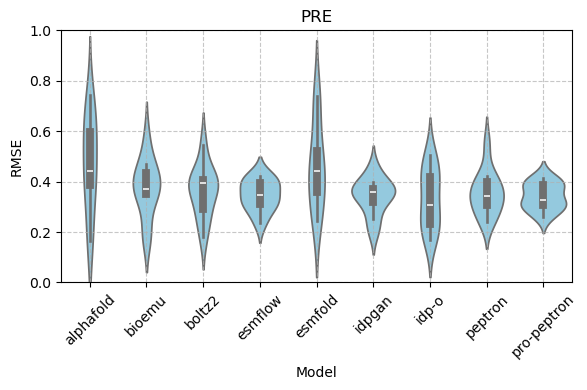

In [3]:
# List of models
models = ['alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800']

# Collect PRE RMSE values
statsdict = {}

for model in models:
    pre_rmse = []
    for protein in priordict[model]:
        pre_rmse.append(priordict[model][protein]['Prior RMSE'])
    
    statsdict[model] = {}
    statsdict[model]['PRE RMSE'] = pre_rmse

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for cs in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": cs})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "peptron"}
)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_20250809_236800": "pro-peptron"}
)

# Plotting
fig, ax = plt.subplots(figsize=(6, 4))

sns.violinplot(data=df[df["Metric"]=="PRE RMSE"], 
               x="Model", y="Value", inner="box", color="skyblue")
ax.set_title("PRE")
ax.set_ylabel("RMSE")
ax.tick_params(axis='x', rotation=45)
ax.grid(True, which='major', linestyle='--', alpha=0.7)
ax.set_ylim(0,1)  # adjust if needed

plt.tight_layout()
#plt.savefig(output_path + "all_PRE_prior.png")


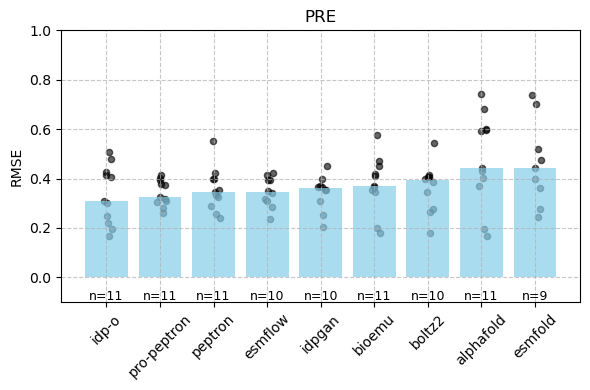

In [4]:

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for pre in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": pre})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "peptron"}
)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_20250809_236800": "pro-peptron"}
)

# Compute medians & counts and sort by median (ascending)
summary = df.groupby("Model")["Value"].agg(["median", "count"]).reset_index()
summary = summary.sort_values("median", ascending=True).reset_index(drop=True)

# Ensure df follows the same model order
df["Model"] = pd.Categorical(df["Model"], categories=summary["Model"], ordered=True)

fig, ax = plt.subplots(figsize=(6, 4))

# Bar plot for medians
bars = ax.bar(summary["Model"], summary["median"], color="skyblue", alpha=0.7)

# Scatter plot of individual data points with jitter
for i, model in enumerate(summary["Model"]):
    vals = df[df["Model"] == model]["Value"]
    # jitter around the x-position
    np.random.seed(0)
    x_jittered = np.random.normal(loc=i, scale=0.05, size=len(vals))
    ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)

# Annotate counts BELOW the x-ticks
for i, row in summary.iterrows():
    ax.text(i, -0.05, f"n={row['count']}",
            ha="center", va="top", fontsize=9)

ax.set_title("PRE")
ax.set_ylabel("RMSE")
ax.tick_params(axis='x', rotation=45)
ax.grid(True, which='major', linestyle='--', alpha=0.7)
ax.set_ylim(-0.1, 1)  # extend lower bound for n= labels

plt.tight_layout()
plt.savefig(output_path + "all_PRE_prior.png", dpi= 300)


Number of common proteins (PRE): 9


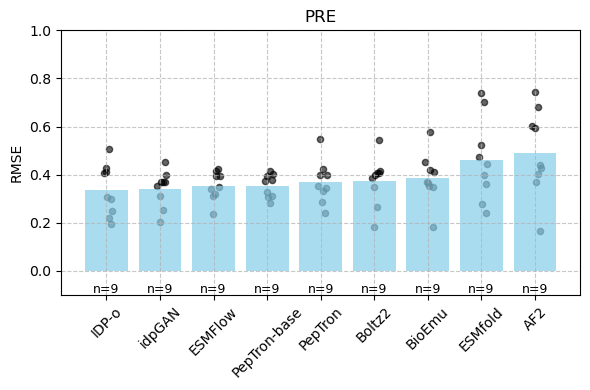

In [5]:
models = [ 
    'alphafold', 'bioemu', 'boltz2', 'esmflow', 'esmfold',
    'idpgan', 'idp-o',
    'peptron_stable_pdb_idrome_20250812_256000',
    'peptron_stable_pdb_20250809_236800'
]

# restrict to common proteins 
all_protein_sets = [set(priordict[m].keys()) for m in models]
common_proteins = set.intersection(*all_protein_sets)
print(f"Number of common proteins (PRE): {len(common_proteins)}")

statsdict = {}

for model in models:
    pre_rmse = []
    for prot in common_proteins:  # only common proteins
        pre_rmse.append(priordict[model][prot]['Prior RMSE'])
    statsdict[model] = {'PRE RMSE': pre_rmse}

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for pre in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": pre})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "PepTron",
     "peptron_stable_pdb_20250809_236800": "PepTron-base",
     "idp-o": "IDP-o",
     "boltz2": "Boltz2",
     "alphafold": "AF2",
     "esmfold": "ESMfold",
     "idpgan": "idpGAN",
     "bioemu": "BioEmu",
     "esmflow": "ESMFlow"}
)

# Compute mean & counts and sort by mean (ascending)
summary = df.groupby("Model")["Value"].agg(["mean", "count"]).reset_index()
summary = summary.sort_values("mean", ascending=True).reset_index(drop=True)

# Ensure df follows the same model order
df["Model"] = pd.Categorical(df["Model"], categories=summary["Model"], ordered=True)

fig, ax = plt.subplots(figsize=(6, 4))

# Bar plot for medians
bars = ax.bar(summary["Model"], summary["mean"], color="skyblue", alpha=0.7)

# Scatter plot of individual data points with jitter
for i, model in enumerate(summary["Model"]):
    vals = df[df["Model"] == model]["Value"]
    np.random.seed(0)
    x_jittered = np.random.normal(loc=i, scale=0.05, size=len(vals))
    ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)

# Annotate counts BELOW the x-ticks
for i, row in summary.iterrows():
    ax.text(i, -0.05, f"n={row['count']}",
            ha="center", va="top", fontsize=9)

ax.set_title("PRE")
ax.set_ylabel("RMSE")
ax.tick_params(axis='x', rotation=45)
ax.grid(True, which='major', linestyle='--', alpha=0.7)
ax.set_ylim(-0.1, 1)  # extend lower bound for n= labels

plt.tight_layout()
plt.savefig(output_path + "all_ranked_PRE_prior_common_proteins_mean.png", dpi=300)


In [ ]:
# analyse all proteins for which there are PRE data & SAXS data (prior and posterior)

# === CONFIG ===
### MAKE SURE TO REPLACE THE PATHS WITH YOUR PATHS

models = ['alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800']
fasta_dir = '../predictions/fasta/'
input_root = '../protonated_predictions/'  
exp_root = '../EXP_DATA/'
tauc_values = np.arange(1,21,1)*1e-9

# === Load protein list ===
files = find_fasta_filenames(fasta_dir)
proteins = [f[:-6] for f in files]
PREproteins = []

for protein in proteins:
    datfiles = find_dat_filenames(exp_root+f"{protein}/")
    info = pd.read_csv(exp_root+f'{protein}/info.csv')
    PRE = 'no'
    for file in datfiles:
        if 'PRE' in file:
            PRE='yes'
            continue
    if PRE=='yes':
        PREproteins.append(protein)
 
print(f"PRE proteins: {PREproteins}")

predict = {}

for model in models:

    predict[model] = {}

    for protein in PREproteins:
    
        # check SAXS reweighting result exists
        if not os.path.exists(f'../protonated_predictions/{model}/{protein}/SAXSrew.npy'):
            continue

        datadict = PREanalysis(model, protein, tauc_values, input_root, exp_root)
        try:
            len(datadict.keys())
        except:
            continue
        
        predict[model][protein] = datadict

print("finished")




PRE proteins: ['FUS', 'OPN', 'A2', 'aSyn', 'ERNTD', 'ACTR', 'Tau', 'd131d', 'Sic1', 'ANAC046', 'FLN5A3A3', 'drkN']
Empty array: esmflow/Tau
Empty array: esmfold/Tau
Empty array: idpgan/Tau
finished


In [8]:
# summary barplots of PRE RMSE values

rmse_mu = []
rmse_sd = []
rmse_median = []
rmse_prior_mu = []
rmse_prior_sd = []
rmse_prior_median = []
rmse_min = []
rmse_prior_min = []

allvalues = {}
allvalues_prior = {}

for model in models:

    values = []
    values_prior = []
    tmpprot = []

    for protein in list(predict[model].keys()):

        if len(list(predict[model][protein]))==0:
            continue

        tmpprot.append(protein)
        values.append(predict[model][protein]['Post RMSE'])
        values_prior.append(predict[model][protein]['Prior RMSE'])

    allvalues[model] = values
    allvalues_prior[model] = values_prior
    
    rmse_mu.append(np.mean(values))
    rmse_prior_mu.append(np.mean(values_prior))
    rmse_sd.append(np.std(values))
    rmse_prior_sd.append(np.std(values_prior))
    rmse_median.append(np.median(values))
    rmse_prior_median.append(np.median(values_prior))
    rmse_min.append(np.min(values))
    rmse_prior_min.append(np.min(values_prior))
    print(model, "Min. RMSE:", tmpprot[np.where(values==np.min(values))[0][0]])
    print(model, "Min. RMSE no rew.:", tmpprot[np.where(values_prior==np.min(values_prior))[0][0]])

df = pd.DataFrame()

df['Model'] = models
df['RMSE mean'] = rmse_mu
df['RMSE median'] = rmse_median
df['RMSE sd'] = rmse_sd
df['RMSE no rew. mean'] = rmse_prior_mu
df['RMSE no rew. median'] = rmse_prior_median
df['RMSE no rew. sd'] = rmse_prior_sd
df['min. RMSE'] = rmse_min
df['min. RMSE no rew.'] = rmse_prior_min
print(np.mean(df['RMSE mean']))
print(np.mean(df['RMSE no rew. mean']))
df


alphafold Min. RMSE: aSyn
alphafold Min. RMSE no rew.: aSyn
bioemu Min. RMSE: Tau
bioemu Min. RMSE no rew.: aSyn
boltz2 Min. RMSE: Sic1
boltz2 Min. RMSE no rew.: Sic1
esmflow Min. RMSE: ACTR
esmflow Min. RMSE no rew.: Sic1
esmfold Min. RMSE: aSyn
esmfold Min. RMSE no rew.: aSyn
idpgan Min. RMSE: Sic1
idpgan Min. RMSE no rew.: Sic1
idp-o Min. RMSE: Tau
idp-o Min. RMSE no rew.: Tau
peptron_stable_pdb_idrome_20250812_256000 Min. RMSE: aSyn
peptron_stable_pdb_idrome_20250812_256000 Min. RMSE no rew.: aSyn
peptron_stable_pdb_20250809_236800 Min. RMSE: aSyn
peptron_stable_pdb_20250809_236800 Min. RMSE no rew.: Tau
0.3642887956732925
0.3681776448729679


,Model,RMSE mean,RMSE median,RMSE sd,RMSE no rew. mean,RMSE no rew. median,RMSE no rew. sd,min. RMSE,min. RMSE no rew.
0,alphafold,0.437161,0.414537,0.188093,0.437161,0.414537,0.188093,0.166302,0.166302
1,bioemu,0.338347,0.354063,0.076573,0.343658,0.367715,0.093656,0.198757,0.181519
2,boltz2,0.383358,0.394722,0.100126,0.382412,0.399740,0.100481,0.179949,0.180045
3,esmflow,0.345316,0.330092,0.050314,0.347882,0.341970,0.062530,0.296374,0.234895
4,esmfold,0.441536,0.442422,0.153667,0.441536,0.442422,0.153667,0.242293,0.242293
5,idpgan,0.345762,0.337979,0.065209,0.350519,0.367743,0.072875,0.237004,0.201803
6,idp-o,0.285005,0.275149,0.081716,0.297989,0.277732,0.097970,0.170611,0.167966
7,peptron_stable_pdb_idrome_20250812_256000,0.357130,0.370622,0.078596,0.363551,0.375585,0.095664,0.246061,0.241092
8,peptron_stable_pdb_20250809_236800,0.344984,0.343108,0.069382,0.348890,0.349292,0.052025,0.246698,0.261452


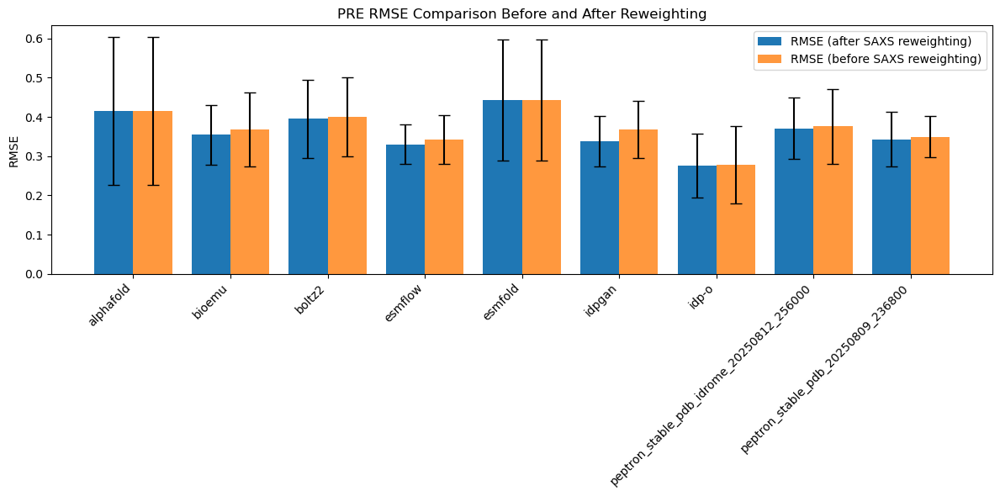

In [9]:
# Create bar positions
x = np.arange(len(df["Model"]))  # the label locations
width = 0.4  # width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Bars
rects1 = ax.bar(x - width/2, df["RMSE median"], width, yerr=df["RMSE sd"], capsize=5, label="RMSE (after SAXS reweighting)")
rects2 = ax.bar(x + width/2, df["RMSE no rew. median"], width, yerr=df["RMSE no rew. sd"], capsize=5, label="RMSE (before SAXS reweighting)", alpha=0.8)

# Labels and formatting
ax.set_ylabel("RMSE")
ax.set_title(f"PRE RMSE Comparison Before and After Reweighting")
ax.set_xticks(x)
ax.set_xticklabels(df["Model"], rotation=45, ha="right")
ax.legend()

plt.tight_layout()
#plt.savefig(output_path+'PRE_RMSE_models.png', dpi=300)

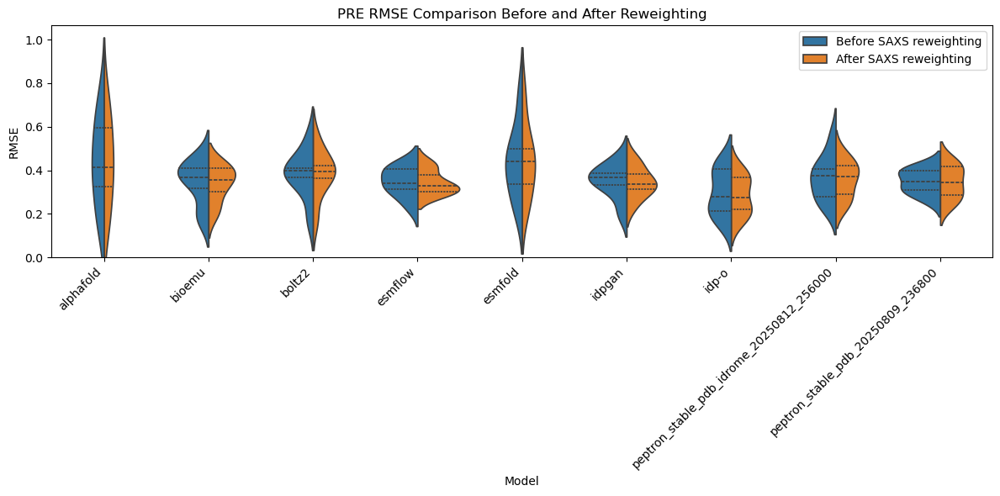

In [10]:
# violin plot

df_list = []

# Before reweighting
for model, vals in allvalues_prior.items():
    df_list.append(pd.DataFrame({
        "Model": model,
        "Condition": "Before SAXS reweighting",
        "RMSE": vals
    }))

# After reweighting
for model, vals in allvalues.items():
    df_list.append(pd.DataFrame({
        "Model": model,
        "Condition": "After SAXS reweighting",
        "RMSE": vals
    }))

# Combine into long DataFrame
df_long = pd.concat(df_list, ignore_index=True)

# Plot violin plot
fig, ax = plt.subplots(figsize=(12, 6))
sns.violinplot(
    data=df_long,
    x="Model",
    y="RMSE",
    hue="Condition",
    split=True,        # both distributions in one violin per model
    inner="quartile",  # show median and quartiles
    ax=ax
)

# Formatting
ax.set_ylabel("RMSE")
ax.set_title(f"PRE RMSE Comparison Before and After Reweighting")
ax.legend(title="")
ax.set_ylim(0,)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
#plt.savefig(output_path+"PRE_RMSE_violin.png", dpi=300)

In [ ]:
# analyse all proteins for which there are PRE data & cross-correlation with SAXS data

### WARNING: TAKES A WHILE TO RUN ###

# === CONFIG ===
### MAKE SURE TO REPLACE THE PATHS WITH YOUR PATHS

models = ['alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800']
fasta_dir = '../predictions/fasta/'
input_root = '../protonated_predictions/'  
exp_root = '../EXP_DATA/'
tauc_values = np.arange(1,21,1)*1e-9

# === Load protein list ===
files = find_fasta_filenames(fasta_dir)
proteins = [f[:-6] for f in files]
PREproteins = []

for protein in proteins:
    datfiles = find_dat_filenames(exp_root+f"{protein}/")
    info = pd.read_csv(exp_root+f'{protein}/info.csv')
    PRE = 'no'
    for file in datfiles:
        if 'PRE' in file:
            PRE='yes'
            continue
    if PRE=='yes':
        PREproteins.append(protein)
 
print(f"PRE proteins: {PREproteins}")

predict = {}

for model in models:

    print(f'Working on {model} models...')

    predict[model] = {}

    for protein in PREproteins:
        # check SAXS reweighting result exists
        if not os.path.exists(f'../protonated_predictions/{model}/{protein}/SAXSrew.npy'):
            continue

        try:
            saxsrew = np.load(f'../protonated_predictions/{model}/{protein}/SAXSrew.npy',allow_pickle=True).item()
            len(list(saxsrew.keys()))
        except:
            print(f'Empty array: {model}/{protein}: skipping...')

        print(protein)
        datadict = PREanalysis_SAXScorr(model, protein, tauc_values, input_root, exp_root)
        try:
            len(datadict.keys())
        except:
            continue
        
        predict[model][protein] = datadict

# save the output for further analysis/plots
np.save(output_path+'PRE_SAXSrew_corr_analysis_dict.npy', predict)

print("finished")


PRE proteins: ['FUS', 'OPN', 'A2', 'aSyn', 'ERNTD', 'ACTR', 'Tau', 'd131d', 'Sic1', 'ANAC046', 'FLN5A3A3', 'drkN']
Working on alphafold models...
aSyn
ERNTD
ACTR
Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on bioemu models...
aSyn
ERNTD
ACTR
Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on boltz2 models...
aSyn
ERNTD
ACTR
Sic1
ANAC046
FLN5A3A3
drkN
Working on esmflow models...
aSyn
ERNTD
ACTR
Empty array: esmflow/Tau: skipping...
Tau
Empty SAXS reweighting array: esmflow/Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on esmfold models...
aSyn
ERNTD
ACTR
Empty array: esmfold/Tau: skipping...
Tau
Empty SAXS reweighting array: esmfold/Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on idpgan models...
aSyn
ERNTD
ACTR
Empty array: idpgan/Tau: skipping...
Tau
Empty SAXS reweighting array: idpgan/Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on idp-o models...
aSyn
ERNTD
ACTR
Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on peptron_stable_pdb_idrome_20250812_256000 models...
aSyn
ERNTD
ACTR
Tau
Sic1
ANAC046
FLN5A3A3
drkN
Working on p

In [81]:
predict['bioemu']['aSyn'].keys()

dict_keys([62, 24, 42, 87, 103, 'Post RMSE', 'Post Opt TAUC', 'All Post RMSE', 'Final ESS', 'Final Post IDX', 'Prior RMSE', 'Prior Opt TAUC'])

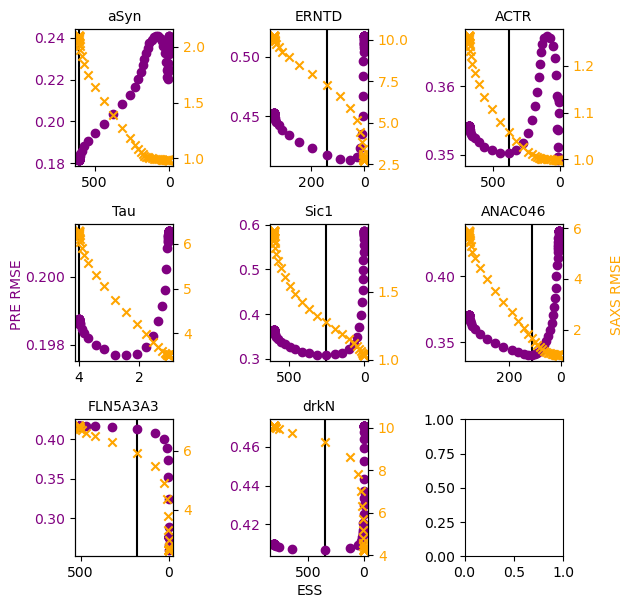

In [2]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'bioemu'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



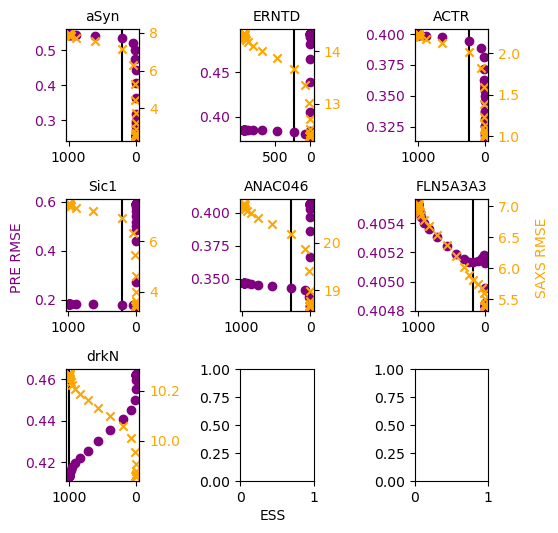

In [12]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'boltz2'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



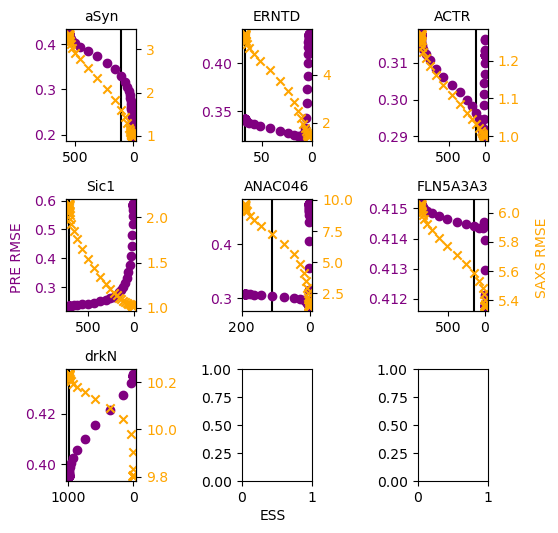

In [13]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'esmflow'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



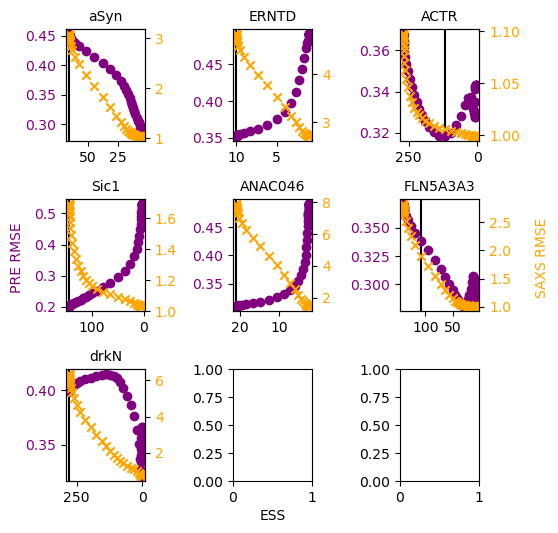

In [14]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'idpgan'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



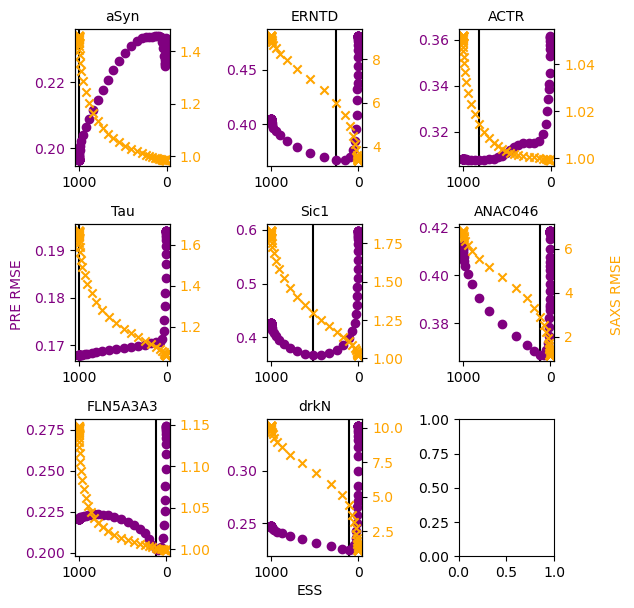

In [15]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'idp-o'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



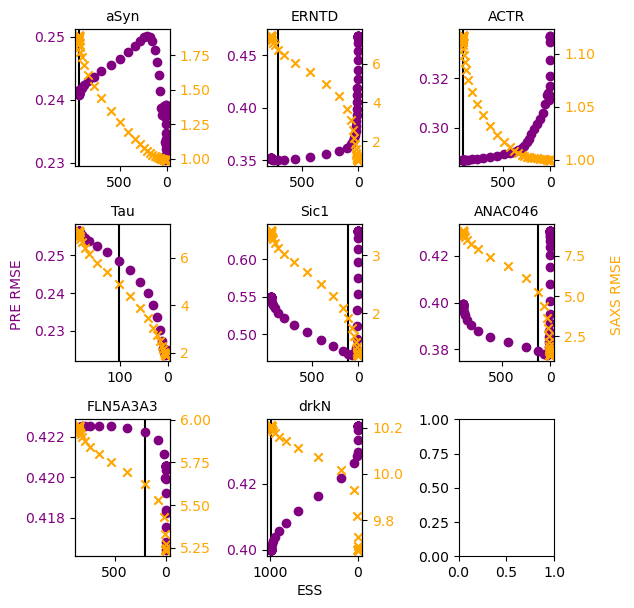

In [16]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'peptron_stable_pdb_idrome_20250812_256000'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)


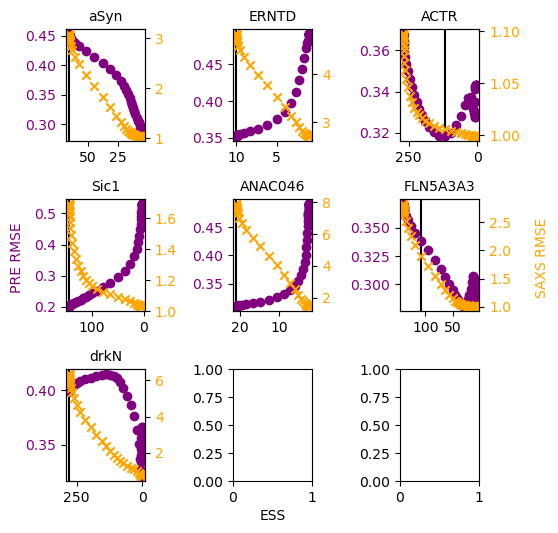

In [17]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'idpgan'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



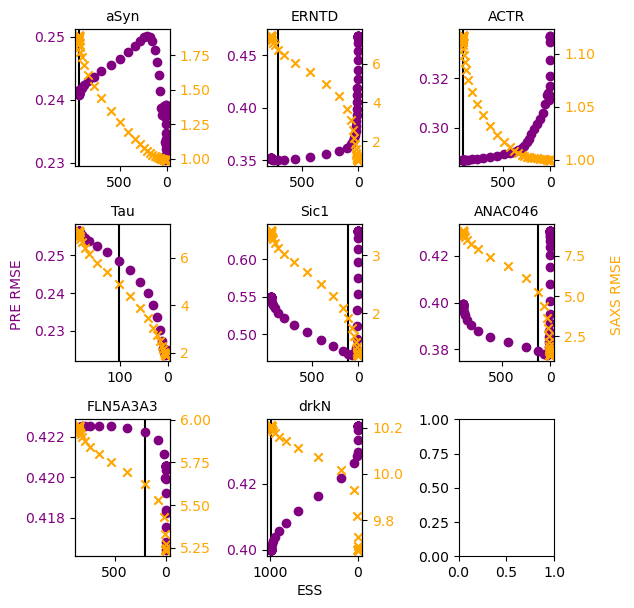

In [18]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'peptron_stable_pdb_idrome_20250812_256000'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



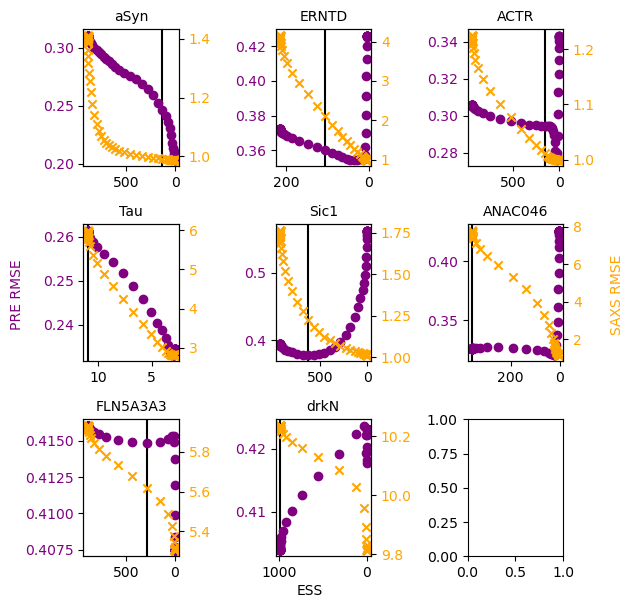

In [19]:
# plot cross-correlation results (ESS on x-axis, left y-axis PRE RMSE, right y-axis SAXS RMSE)

model = 'peptron_stable_pdb_20250809_236800'

# load cross-correlation data
predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

PROTEINS = list(predict[model].keys())

# Create subplots
ncols = math.ceil(math.sqrt(len(PROTEINS)))
nrows = math.ceil(len(PROTEINS) / ncols)
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=False, sharey=False, figsize=(len(PROTEINS)*0.75,len(PROTEINS)*0.75))
axs = axes.ravel() 
for i, prot in enumerate(PROTEINS):
    ax = axs[i]
    ax.set_title(prot, fontsize = 10)

    if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
        continue
    saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
    try:
        len(saxsrew.keys())
    except:
        print(f'Empty array: {model}/{protein}: skipping...')
        continue
    
    # left y-axis (PRE RMSE)
    ax.scatter(saxsrew['all_ess'], predict[model][prot]['All Post RMSE'], label='PRE RMSE', color='purple')
    ax.tick_params(axis='y', labelcolor="purple")
    # Flip the x-axis
    ax.invert_xaxis()

    # right y-axis (ESS)
    ax2 = ax.twinx()
    ax2.scatter(saxsrew['all_ess'], saxsrew['all_post_rmse'], label='SAXS RMSE', color='orange', marker='x')
    ax2.tick_params(axis='y', labelcolor="orange")

    # annotate optimal posterior ensemble on plot
    ax.axvline(saxsrew['all_ess'][predict[model][prot]['Final Post IDX']],color='black', zorder=-10)

# Set one master x and y label
fig.text(0.5, 0.0, 'ESS', ha='center', fontsize=10)  # shared x-label
fig.text(0.0, 0.5, 'PRE RMSE', va='center', rotation='vertical', fontsize=10, color='purple')  # left y-label
fig.text(1.0, 0.5, 'SAXS RMSE', va='center', rotation='vertical', fontsize=10, color='orange')    # right y-label


plt.tight_layout()
plt.savefig(output_path+f'PRE_SAXSrew_correlation_{model}.png', dpi=200)



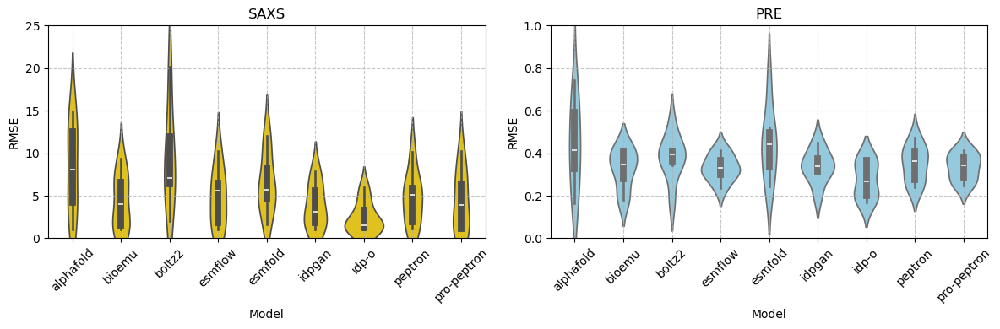

In [6]:
# final statistics/distribution of reweighted ensembles for SAXS/PRE
# using the cross-correlation curves - we find the optimal SAXS reweighting theta (where PRE agreement is best to avoid overfitting)
# then we get the statistics for these posterior ensembles

models = [ 'alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800'] 

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

statsdict = {}

for model in models:

    proteins = list(predict[model].keys())
    pre_rmse = []
    saxs_rmse = []
    for prot in proteins:
        pre_rmse.append(predict[model][prot]['Post RMSE'])
        # saxs
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            continue
        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
        try:
            len(list(saxsrew.keys()))
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        # optimal posterior ensembles
        IDX = predict[model][prot]['Final Post IDX']
        saxs_rmse.append(saxsrew['all_post_rmse'][IDX])
    
    statsdict[model] = {}
    statsdict[model]['PRE RMSE'] = pre_rmse
    statsdict[model]['SAXS RMSE'] = saxs_rmse

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "peptron"}
)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_20250809_236800": "pro-peptron"}
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)

# Violin plot for SAXS RMSE
sns.violinplot(data=df[df["Metric"]=="SAXS RMSE"], 
               x="Model", y="Value", ax=axes[0], inner="box", color="gold")
axes[0].set_title("SAXS")
axes[0].set_ylabel("RMSE")
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True, which='major', linestyle='--', alpha=0.7)
axes[0].set_ylim(0,25)

# Violin plot for PRE RMSE
sns.violinplot(data=df[df["Metric"]=="PRE RMSE"], 
               x="Model", y="Value", ax=axes[1], inner="box", color = "skyblue")
axes[1].set_title("PRE")
axes[1].set_ylabel('RMSE')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True, which='major', linestyle='--', alpha=0.7)
axes[1].set_ylim(0,1)

plt.tight_layout()
#plt.savefig(output_path+f"final_SAXS_PRE_stats_crosscorr.png")


/tmp/ipykernel_2984686/2252282088.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
/tmp/ipykernel_2984686/2252282088.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)


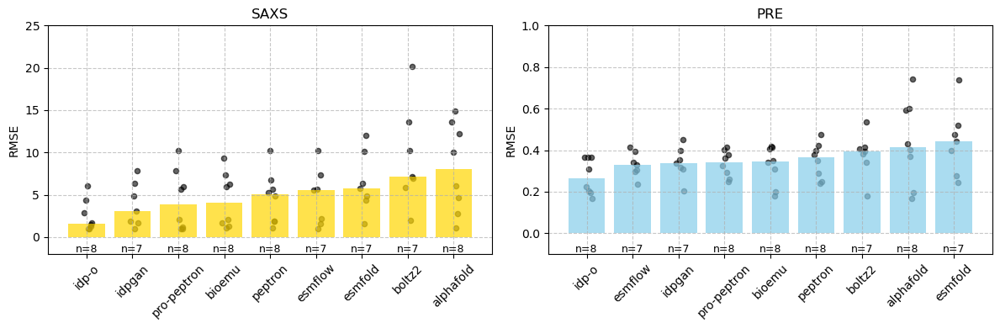

In [7]:
# final statistics/distribution of reweighted ensembles for SAXS/PRE
# using the cross-correlation curves - we find the optimal SAXS reweighting theta (where PRE agreement is best to avoid overfitting)
# then we get the statistics for these posterior ensembles

models = [ 'alphafold', 'bioemu',  'boltz2',  'esmflow',  'esmfold',  'idpgan',  'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800'] 

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy',allow_pickle=True).item()

statsdict = {}

for model in models:

    proteins = list(predict[model].keys())
    pre_rmse = []
    saxs_rmse = []
    for prot in proteins:
        pre_rmse.append(predict[model][prot]['Post RMSE'])
        # saxs
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            continue
        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy',allow_pickle=True).item()
        try:
            len(list(saxsrew.keys()))
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        # optimal posterior ensembles
        IDX = predict[model][prot]['Final Post IDX']
        saxs_rmse.append(saxsrew['all_post_rmse'][IDX])
    
    statsdict[model] = {}
    statsdict[model]['PRE RMSE'] = pre_rmse
    statsdict[model]['SAXS RMSE'] = saxs_rmse

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "peptron",
     "peptron_stable_pdb_20250809_236800": "pro-peptron"}
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)

for i, metric in enumerate(["SAXS RMSE", "PRE RMSE"]):
    df_metric = df[df["Metric"]==metric]
    
    # Compute medians & counts, sort ascending by median
    summary = df_metric.groupby("Model")["Value"].agg(["median", "count"]).reset_index()
    summary = summary.sort_values("median", ascending=True).reset_index(drop=True)
    
    # Ensure df follows same model order
    df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
    
    ax = axes[i]
    
    # Bar plot for medians
    ax.bar(summary["Model"], summary["median"], color="gold" if metric=="SAXS RMSE" else "skyblue", alpha=0.7)
    
    # Scatter plot for all points with jitter
    for j, model in enumerate(summary["Model"]):
        vals = df_metric[df_metric["Model"]==model]["Value"].values
        np.random.seed(0)
        x_jittered = np.random.normal(loc=j, scale=0.05, size=len(vals))
        ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)
    
    # Annotate counts below x-ticks
    for j, row in summary.iterrows():
        ax.text(j, -0.8 if metric=="SAXS RMSE" else -0.05, f"n={row['count']}", ha="center", va="top", fontsize=9)
    
    # Set labels and title
    ax.set_title("SAXS" if metric=="SAXS RMSE" else "PRE")
    ax.set_ylabel("RMSE")
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, which='major', linestyle='--', alpha=0.7)
    
    # Set y-limits
    if metric=="SAXS RMSE":
        ax.set_ylim(-2, 25)
    else:
        ax.set_ylim(-0.1, 1)

plt.tight_layout()
#plt.savefig(output_path + "final_SAXS_PRE_stats_crosscorr.png", dpi =300)


Number of common proteins with PRE+SAXS: 7


/tmp/ipykernel_2984686/158838705.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
/tmp/ipykernel_2984686/158838705.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)


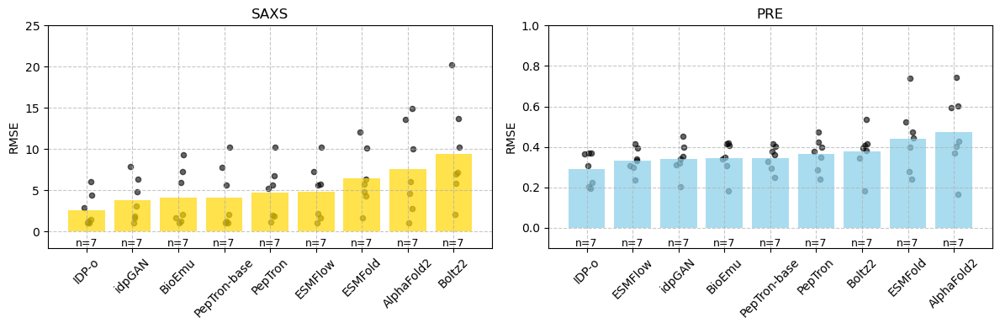

In [12]:
models = [ 
    'alphafold', 'bioemu', 'boltz2', 'esmflow', 'esmfold',
    'idpgan', 'idp-o',
    'peptron_stable_pdb_idrome_20250812_256000',
    'peptron_stable_pdb_20250809_236800'
]

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy', allow_pickle=True).item()

# restrict to proteins that all models share 
all_protein_sets = [set(predict[m].keys()) for m in models]
common_proteins = set.intersection(*all_protein_sets)

# Also filter only proteins where SAXSrew.npy exists for all models
common_with_saxs = set()
for prot in common_proteins:
    ok = True
    for model in models:
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            ok = False
            break
    if ok:
        common_with_saxs.add(prot)

print(f"Number of common proteins with PRE+SAXS: {len(common_with_saxs)}")

statsdict = {}

for model in models:
    pre_rmse = []
    saxs_rmse = []
    for prot in common_with_saxs:  
        pre_rmse.append(predict[model][prot]['Post RMSE'])

        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy', allow_pickle=True).item()
        try:
            _ = list(saxsrew.keys())
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        # optimal posterior ensembles
        IDX = predict[model][prot]['Final Post IDX']
        saxs_rmse.append(saxsrew['all_post_rmse'][IDX])
    
    statsdict[model] = {
        'PRE RMSE': pre_rmse,
        'SAXS RMSE': saxs_rmse
    }

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "PepTron",
     "peptron_stable_pdb_20250809_236800": "PepTron-base",
     "idp-o": "IDP-o",
     "boltz2": "Boltz2",
     "alphafold": "AlphaFold2",
     "esmfold": "ESMFold",
     "idpgan": "idpGAN",
     "bioemu": "BioEmu",
     "esmflow": "ESMFlow"}
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)

for i, metric in enumerate(["SAXS RMSE", "PRE RMSE"]):
    df_metric = df[df["Metric"] == metric]
    
    # Compute medians & counts, sort ascending by mean
    summary = df_metric.groupby("Model")["Value"].agg(["mean", "count"]).reset_index()
    summary = summary.sort_values("mean", ascending=True).reset_index(drop=True)
    
    # Ensure df follows same model order
    df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
    
    ax = axes[i]
    
    # Bar plot for means
    ax.bar(summary["Model"], summary["mean"],
           color="gold" if metric == "SAXS RMSE" else "skyblue", alpha=0.7)
    
    # Scatter plot for all points with jitter
    for j, model in enumerate(summary["Model"]):
        vals = df_metric[df_metric["Model"] == model]["Value"].values
        np.random.seed(0)
        x_jittered = np.random.normal(loc=j, scale=0.05, size=len(vals))
        ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)
    
    # Annotate counts below x-ticks
    for j, row in summary.iterrows():
        ax.text(j, -0.8 if metric == "SAXS RMSE" else -0.05,
                f"n={row['count']}", ha="center", va="top", fontsize=9)
    
    # Set labels and title
    ax.set_title("SAXS" if metric == "SAXS RMSE" else "PRE")
    ax.set_ylabel("RMSE")
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, which='major', linestyle='--', alpha=0.7)
    
    # Set y-limits
    if metric == "SAXS RMSE":
        ax.set_ylim(-2, 25)
    else:
        ax.set_ylim(-0.1, 1)

plt.tight_layout()
plt.savefig(output_path + "final_ranked_SAXS_PRE_stats_crosscorr_common_proteins_mean.png", dpi=300)


Number of common proteins with PRE+SAXS: 7


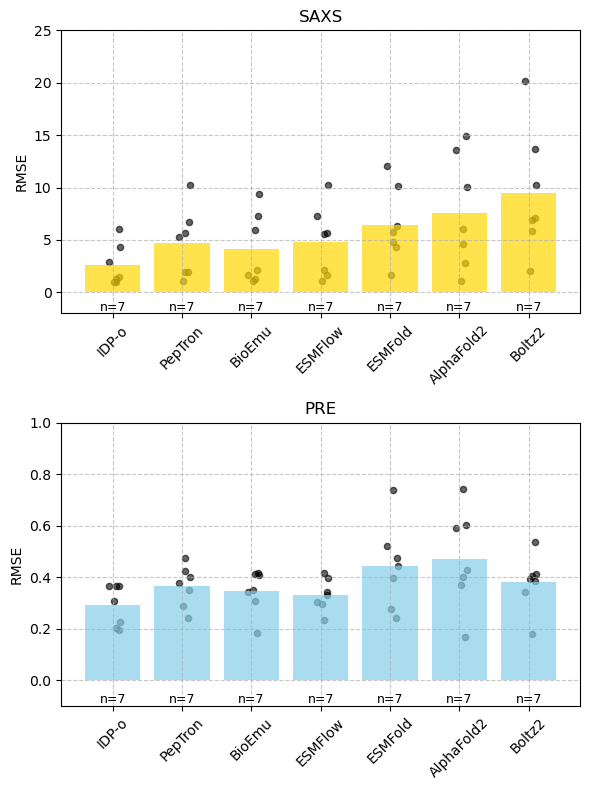

In [13]:


models = [ 
    'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'bioemu', 
    'esmflow', 'esmfold', 'alphafold', 'boltz2'
]

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy', allow_pickle=True).item()

# restrict to proteins that all models share 
all_protein_sets = [set(predict[m].keys()) for m in models]
common_proteins = set.intersection(*all_protein_sets)

# Also filter only proteins where SAXSrew.npy exists for all models
common_with_saxs = set()
for prot in common_proteins:
    ok = True
    for model in models:
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            ok = False
            break
    if ok:
        common_with_saxs.add(prot)

print(f"Number of common proteins with PRE+SAXS: {len(common_with_saxs)}")

statsdict = {}

for model in models:
    pre_rmse = []
    saxs_rmse = []
    for prot in common_with_saxs:  
        pre_rmse.append(predict[model][prot]['Post RMSE'])

        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy', allow_pickle=True).item()
        try:
            _ = list(saxsrew.keys())
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        # optimal posterior ensembles
        IDX = predict[model][prot]['Final Post IDX']
        saxs_rmse.append(saxsrew['all_post_rmse'][IDX])
    
    statsdict[model] = {
        'PRE RMSE': pre_rmse,
        'SAXS RMSE': saxs_rmse
    }

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)

# Replace names for nicer display
df["Model"] = df["Model"].replace(
    {
        "peptron_stable_pdb_idrome_20250812_256000": "PepTron",
        "idp-o": "IDP-o",
        "alphafold": "AlphaFold2",
        "boltz2": "Boltz2",
        "esmflow": "ESMFlow",
        "esmfold": "ESMFold",
        "bioemu": "BioEmu",
        "peptron_stable_pdb_20250809_236800": "PepTron-base"
    }
)

# Define desired display order after renaming
model_order = [
    "IDP-o", "PepTron", "BioEmu", "ESMFlow", "ESMFold", "AlphaFold2", "Boltz2"
]

fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharey=False)

for i, metric in enumerate(["SAXS RMSE", "PRE RMSE"]):
    df_metric = df[df["Metric"] == metric].copy()
    
    # Enforce model order as categorical
    df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=model_order, ordered=True)
    
    # Compute mean & counts
    summary = (
        df_metric.groupby("Model")["Value"]
        .agg(["mean", "count"])
        .reset_index()
    )
    summary = summary.dropna(subset=["Model"])
    
    ax = axes[i]
    
    # Integer positions for x-axis
    x = np.arange(len(summary))
    
    # Bar plot for means
    ax.bar(x, summary["mean"],
           color="gold" if metric == "SAXS RMSE" else "skyblue", alpha=0.7)
    
    # Scatter plot with jitter
    for j, model in enumerate(summary["Model"]):
        vals = df_metric[df_metric["Model"] == model]["Value"].values
        if len(vals) == 0:
            continue
        np.random.seed(0)
        x_jittered = np.random.normal(loc=j, scale=0.05, size=len(vals))
        ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)
    
    # Annotate counts
    for j, row in summary.iterrows():
        ax.text(
            j,
            -0.8 if metric == "SAXS RMSE" else -0.05,
            f"n={row['count']}", ha="center", va="top", fontsize=9
        )
    
    # Labels & ticks
    ax.set_title("SAXS" if metric == "SAXS RMSE" else "PRE")
    ax.set_ylabel("RMSE")
    ax.set_xticks(np.arange(len(model_order)))
    ax.set_xticklabels(model_order, rotation=45)
    ax.grid(True, which='major', linestyle='--', alpha=0.7)
    
    # Y limits
    if metric == "SAXS RMSE":
        ax.set_ylim(-2, 25)
    else:
        ax.set_ylim(-0.1, 1)

plt.tight_layout()
plt.savefig(output_path + "FINAL_SAXS_PRE_stats_crosscorr_common_proteins_mean.png", dpi=300)


Number of common proteins with PRE+SAXS: 7


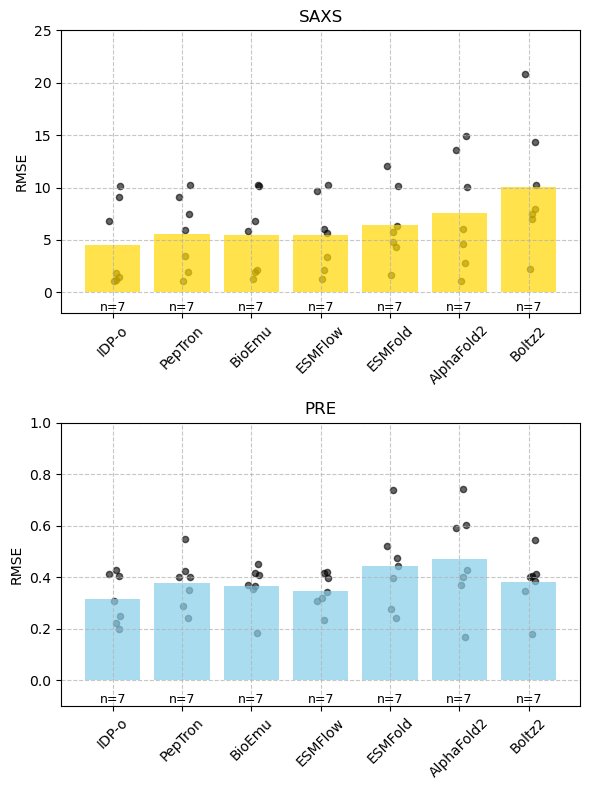

In [14]:


models = [ 
    'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'bioemu', 
    'esmflow', 'esmfold', 'alphafold', 'boltz2'
]

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy', allow_pickle=True).item()

# restrict to proteins that all models share 
all_protein_sets = [set(predict[m].keys()) for m in models]
common_proteins = set.intersection(*all_protein_sets)

# Also filter only proteins where SAXSrew.npy exists for all models
common_with_saxs = set()
for prot in common_proteins:
    ok = True
    for model in models:
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            ok = False
            break
    if ok:
        common_with_saxs.add(prot)

print(f"Number of common proteins with PRE+SAXS: {len(common_with_saxs)}")

statsdict = {}

for model in models:
    pre_rmse = []
    saxs_rmse = []
    for prot in common_with_saxs:  
        pre_rmse.append(predict[model][prot]['Prior RMSE'])

        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy', allow_pickle=True).item()
        try:
            _ = list(saxsrew.keys())
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        
        saxs_rmse.append(saxsrew['prior_rmse'])
    
    statsdict[model] = {
        'PRE RMSE': pre_rmse,
        'SAXS RMSE': saxs_rmse
    }

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)

# Replace names for nicer display
df["Model"] = df["Model"].replace(
    {
        "peptron_stable_pdb_idrome_20250812_256000": "PepTron",
        "idp-o": "IDP-o",
        "alphafold": "AlphaFold2",
        "boltz2": "Boltz2",
        "esmflow": "ESMFlow",
        "esmfold": "ESMFold",
        "bioemu": "BioEmu",
        "peptron_stable_pdb_20250809_236800": "PepTron-base"
    }
)

# Define desired display order after renaming
model_order = [
    "IDP-o", "PepTron", "BioEmu", "ESMFlow", "ESMFold", "AlphaFold2", "Boltz2"
]

fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharey=False)

for i, metric in enumerate(["SAXS RMSE", "PRE RMSE"]):
    df_metric = df[df["Metric"] == metric].copy()
    
    # Enforce model order as categorical
    df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=model_order, ordered=True)
    
    # Compute mean & counts
    summary = (
        df_metric.groupby("Model")["Value"]
        .agg(["mean", "count"])
        .reset_index()
    )
    summary = summary.dropna(subset=["Model"])
    
    ax = axes[i]
    
    # Integer positions for x-axis
    x = np.arange(len(summary))
    
    # Bar plot for means
    ax.bar(x, summary["mean"],
           color="gold" if metric == "SAXS RMSE" else "skyblue", alpha=0.7)
    
    # Scatter plot with jitter
    for j, model in enumerate(summary["Model"]):
        vals = df_metric[df_metric["Model"] == model]["Value"].values
        if len(vals) == 0:
            continue
        np.random.seed(0)
        x_jittered = np.random.normal(loc=j, scale=0.05, size=len(vals))
        ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)
    
    # Annotate counts
    for j, row in summary.iterrows():
        ax.text(
            j,
            -0.8 if metric == "SAXS RMSE" else -0.05,
            f"n={row['count']}", ha="center", va="top", fontsize=9
        )
    
    # Labels & ticks
    ax.set_title("SAXS" if metric == "SAXS RMSE" else "PRE")
    ax.set_ylabel("RMSE")
    ax.set_xticks(np.arange(len(model_order)))
    ax.set_xticklabels(model_order, rotation=45)
    ax.grid(True, which='major', linestyle='--', alpha=0.7)
    
    # Y limits
    if metric == "SAXS RMSE":
        ax.set_ylim(-2, 25)
    else:
        ax.set_ylim(-0.1, 1)

plt.tight_layout()
plt.savefig(output_path + "FINAL_SAXS_PRE_stats_prior_common_proteins_mean.png", dpi=300)


Number of common proteins with PRE+SAXS: 7


/tmp/ipykernel_2984686/2627367797.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
/tmp/ipykernel_2984686/2627367797.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)


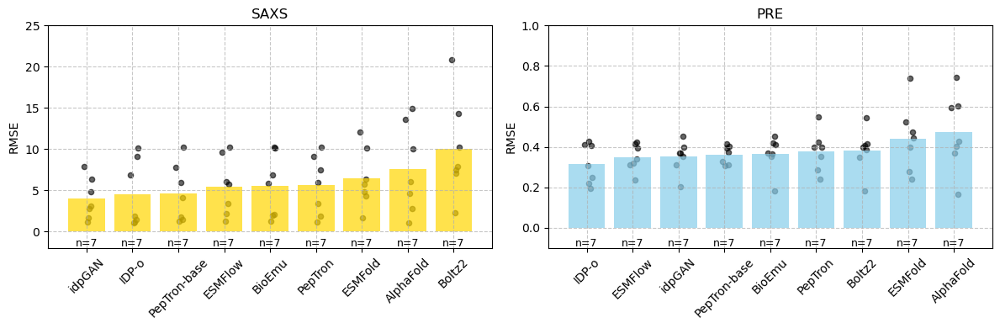

In [15]:
models = [ 
    'alphafold', 'bioemu', 'boltz2', 'esmflow', 'esmfold',
    'idpgan', 'idp-o',
    'peptron_stable_pdb_idrome_20250812_256000',
    'peptron_stable_pdb_20250809_236800'
]

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy', allow_pickle=True).item()

# restrict to proteins that all models share 
all_protein_sets = [set(predict[m].keys()) for m in models]
common_proteins = set.intersection(*all_protein_sets)

# Also filter only proteins where SAXSrew.npy exists for all models
common_with_saxs = set()
for prot in common_proteins:
    ok = True
    for model in models:
        if not os.path.exists(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy'):
            ok = False
            break
    if ok:
        common_with_saxs.add(prot)

print(f"Number of common proteins with PRE+SAXS: {len(common_with_saxs)}")

statsdict = {}

for model in models:
    pre_rmse = []
    saxs_rmse = []
    for prot in common_with_saxs:  
        pre_rmse.append(predict[model][prot]['Prior RMSE'])

        saxsrew = np.load(f'../protonated_predictions/{model}/{prot}/SAXSrew.npy', allow_pickle=True).item()
        try:
            _ = list(saxsrew.keys())
        except:
            print(f'Empty array: {model}/{prot}')
            continue
        # prior ensembles
        saxs_rmse.append(saxsrew['prior_rmse'])
    
    statsdict[model] = {
        'PRE RMSE': pre_rmse,
        'SAXS RMSE': saxs_rmse
    }

# Convert statsdict into a dataframe
data = []
for model, vals in statsdict.items():
    for rmse in vals['PRE RMSE']:
        data.append({"Model": model, "Metric": "PRE RMSE", "Value": rmse})
    for rmse in vals['SAXS RMSE']:
        data.append({"Model": model, "Metric": "SAXS RMSE", "Value": rmse})

df = pd.DataFrame(data)
df["Model"] = df["Model"].replace(
    {"peptron_stable_pdb_idrome_20250812_256000": "PepTron",
     "peptron_stable_pdb_20250809_236800": "PepTron-base",
     "idp-o": "IDP-o",
     "boltz2": "Boltz2",
     "alphafold": "AlphaFold",
     "esmfold": "ESMFold",
     "idpgan": "idpGAN",
     "bioemu": "BioEmu",
     "esmflow": "ESMFlow"}
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=False)

for i, metric in enumerate(["SAXS RMSE", "PRE RMSE"]):
    df_metric = df[df["Metric"] == metric]
    
    # Compute medians & counts, sort ascending by mean
    summary = df_metric.groupby("Model")["Value"].agg(["mean", "count"]).reset_index()
    summary = summary.sort_values("mean", ascending=True).reset_index(drop=True)
    
    # Ensure df follows same model order
    df_metric["Model"] = pd.Categorical(df_metric["Model"], categories=summary["Model"], ordered=True)
    
    ax = axes[i]
    
    # Bar plot for means
    ax.bar(summary["Model"], summary["mean"],
           color="gold" if metric == "SAXS RMSE" else "skyblue", alpha=0.7)
    
    # Scatter plot for all points with jitter
    for j, model in enumerate(summary["Model"]):
        vals = df_metric[df_metric["Model"] == model]["Value"].values
        np.random.seed(0)
        x_jittered = np.random.normal(loc=j, scale=0.05, size=len(vals))
        ax.scatter(x_jittered, vals, color="black", alpha=0.6, s=20)
    
    # Annotate counts below x-ticks
    for j, row in summary.iterrows():
        ax.text(j, -0.8 if metric == "SAXS RMSE" else -0.05,
                f"n={row['count']}", ha="center", va="top", fontsize=9)
    
    # Set labels and title
    ax.set_title("SAXS" if metric == "SAXS RMSE" else "PRE")
    ax.set_ylabel("RMSE")
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, which='major', linestyle='--', alpha=0.7)
    
    # Set y-limits
    if metric == "SAXS RMSE":
        ax.set_ylim(-2, 25)
    else:
        ax.set_ylim(-0.1, 1)

plt.tight_layout()
plt.savefig(output_path + "final_ranked_SAXS_PRE_stats_prior_common_proteins_mean.png", dpi=300)


In [95]:
predict['bioemu']['aSyn'].keys()

dict_keys([62, 24, 42, 87, 103, 'Post RMSE', 'Post Opt TAUC', 'All Post RMSE', 'Final ESS', 'Final Post IDX', 'Prior RMSE', 'Prior Opt TAUC'])

/tmp/ipykernel_2436618/2927838325.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=True, sharey=True, figsize=(nsites*2,nsites*1))


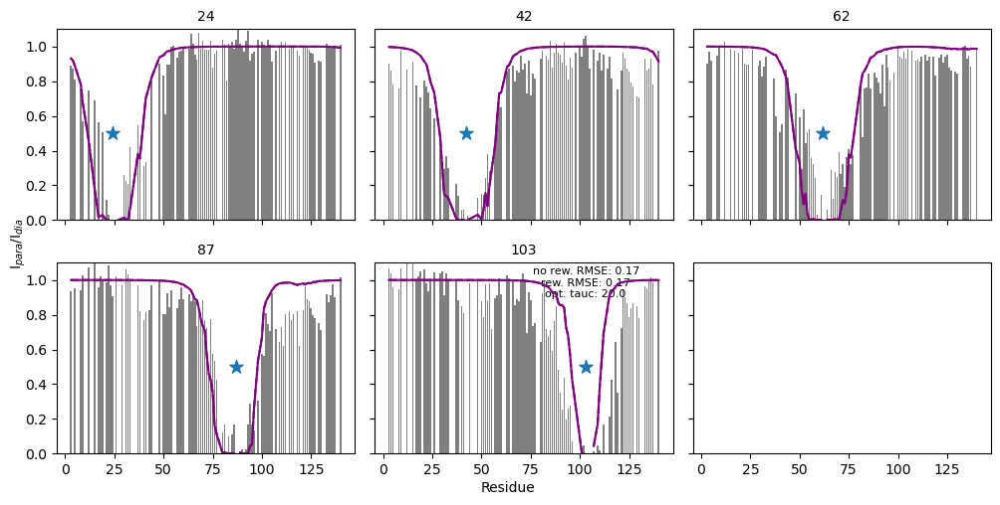

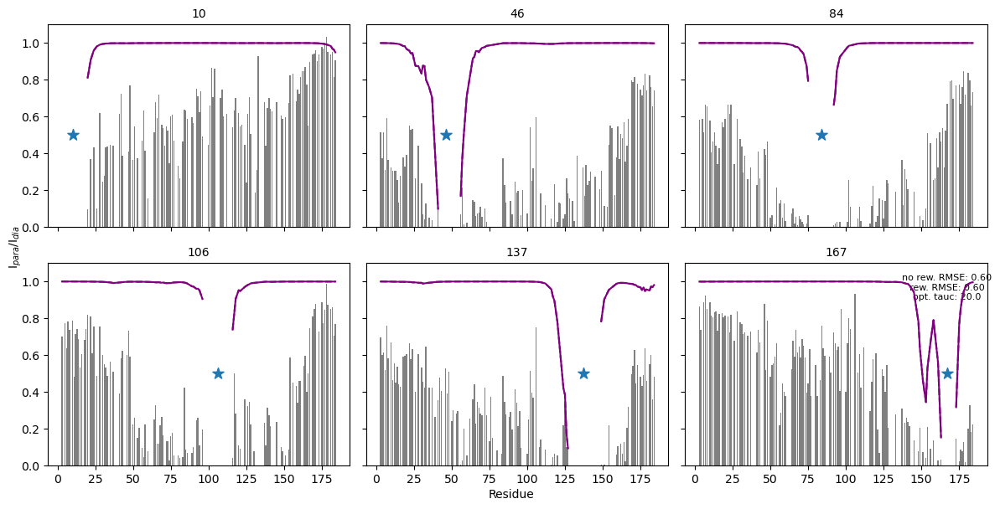

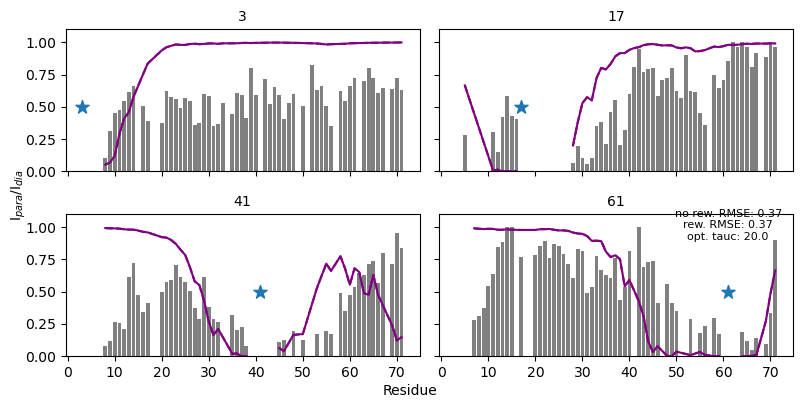

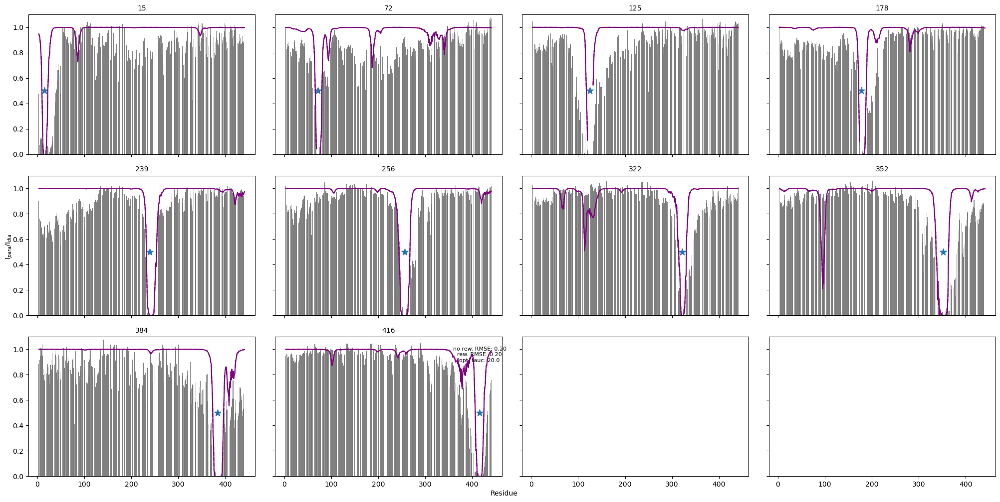

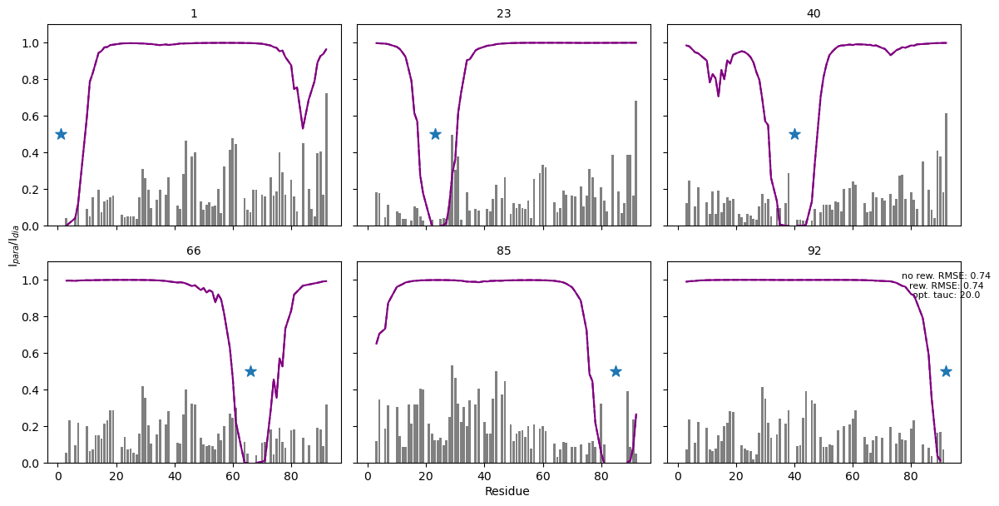

...

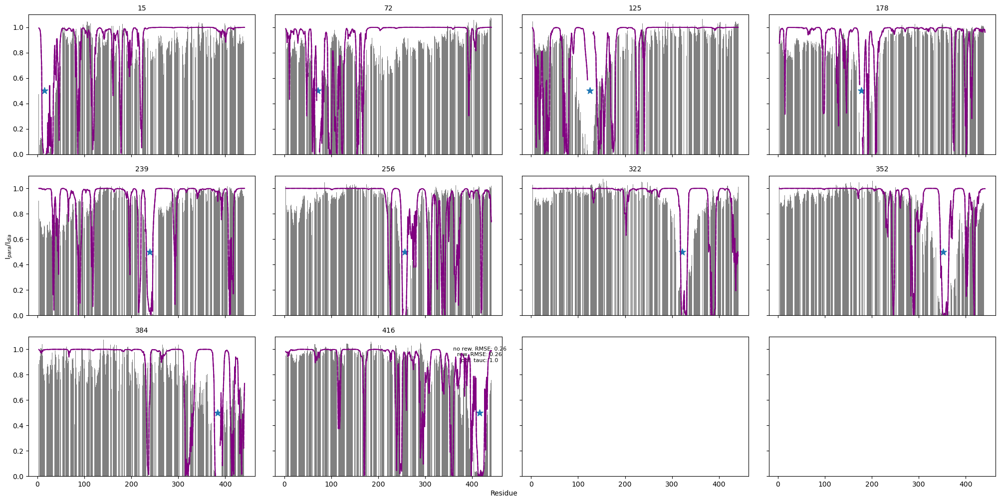

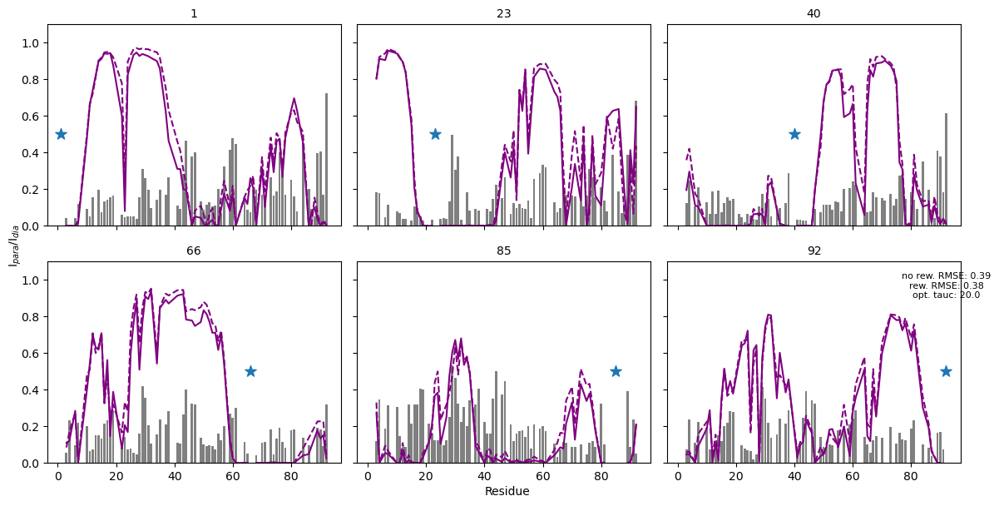

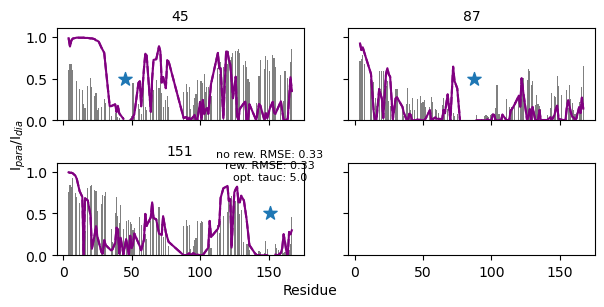

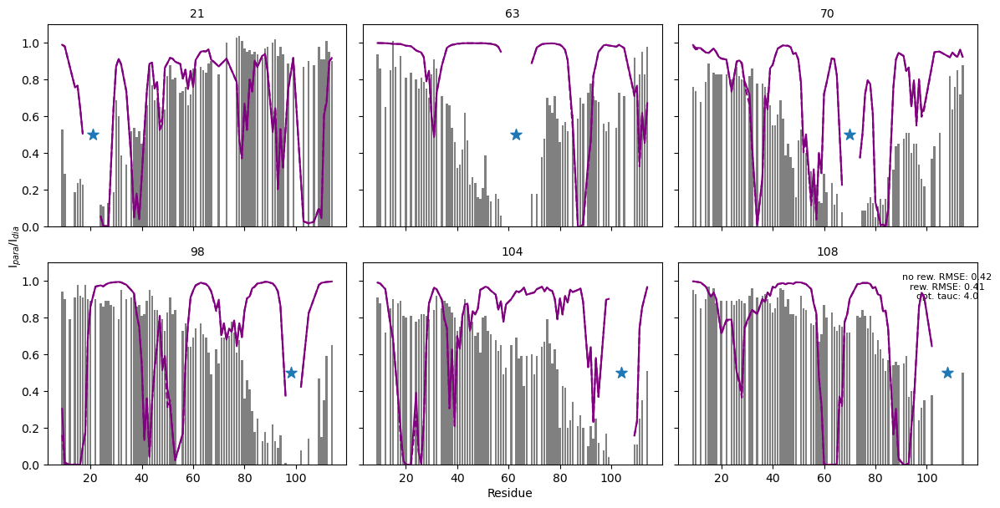

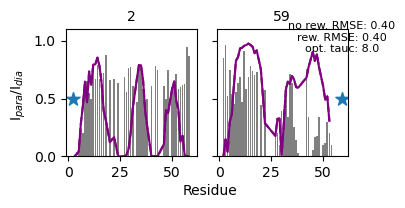

In [ ]:
# plot all model and protein combinations and save in "pre_plots" folder

out_path = './PRE_plots/'
models = ['alphafold', 'bioemu', 'boltz2', 'esmflow', 'esmfold', 'idpgan', 'idp-o', 'peptron_stable_pdb_idrome_20250812_256000', 'peptron_stable_pdb_20250809_236800']

predict = np.load('PRE_analyses/PRE_SAXSrew_corr_analysis_dict.npy', allow_pickle=True).item()

for model in models:
    for protein in PREproteins:
        try:
            datadict=predict[model][protein]
        except:
            continue
        sites = []
        for key in list(datadict.keys()):
            try:
                S = int(key)
                sites.append(S)
            except:
                continue
        nsites = len(sites)
        # sort sites
        sites.sort()

        # Create subplots
        ncols = math.ceil(math.sqrt(nsites))
        nrows = math.ceil(nsites / ncols)
        fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=True, sharey=True, figsize=(nsites*2,nsites*1))
        axs = axes.ravel()
        
        for i, site in enumerate(sites):
            ax = axs[i]
            ax.set_title(site, fontsize = 10)

            ax.bar(datadict[site]['Residue'], datadict[site]['I_exp'], color = 'grey')
            # Split the data into two segments
            residues = datadict[site]['Residue']
            I_post = datadict[site]['I_gen_post']
            I_prior = datadict[site]['I_gen_prior']
            # Find first index where residue > site
            site_idx = next((i for i, r in enumerate(residues) if r > site), len(residues)-1)

            # Segment 1: before site (inclusive)
            res1 = residues[:site_idx]
            I_post1 = I_post[:site_idx]
            I_prior1 = I_prior[:site_idx]

            # Segment 2: after site
            res2 = residues[site_idx:]
            I_post2 = I_post[site_idx:]
            I_prior2 = I_prior[site_idx:]

            # Plot each segment separately
            ax.plot(res1, I_post1, color='purple', zorder=20)
            ax.plot(res2, I_post2, color='purple', zorder=20)

            ax.plot(res1, I_prior1, color='purple', linestyle='dashed', zorder=20)
            ax.plot(res2, I_prior2, color='purple', linestyle='dashed', zorder=20)

            if i==nsites-1:
                text_string = str("no rew. RMSE: {:.2f}\n".format(datadict['Prior RMSE'])) + str("rew. RMSE: {:.2f}\n".format(datadict['Post RMSE'])) + str("opt. tauc: {:.1f}".format(datadict['Post Opt TAUC']))
                ax.text(site, 0.9, text_string, ha='center', fontsize=8)

            ax.scatter(site, 0.5, s=100, marker="*")
            ax.set_ylim(0,1.1)

        # Set one master x and y label
        #fig.supxlabel('Residue', fontsize=10)
        #fig.supylabel('I$_{para}$/I$_{dia}$', fontsize=10)
        fig.text(0.5, -0.00, 'Residue', ha='center', fontsize=10)  # master x-label
        fig.text(-0.00, 0.5, 'I$_{para}$/I$_{dia}$', va='center', rotation='vertical', fontsize=10)  # master y-label
        plt.tight_layout()
        plt.savefig(out_path+f"PRE_{model}_{protein}.png",dpi=200)



In [ ]:
### SANITY CHECK ON SOME EXAMPLES

# === CONFIG ===
models = ['idpgan']
fasta_dir = '../predictions/fasta/'
input_root = '../protonated_predictions/'  
exp_root = '../EXP_DATA/'
tauc_values = np.arange(1,21,1)*1e-9

# === Load protein list ===
files = find_fasta_filenames(fasta_dir)
proteins = [f[:-6] for f in files]
PREproteins = []

for protein in proteins:
    datfiles = find_dat_filenames(exp_root+f"{protein}/")
    info = pd.read_csv(exp_root+f'{protein}/info.csv')
    PRE = 'no'
    for file in datfiles:
        if 'PRE' in file:
            PRE='yes'
            continue
    if PRE=='yes':
        PREproteins.append(protein)
 
print(f"PRE proteins: {PREproteins}")

predict = {}

for model in models:

    print(f'Working on {model} models...')

    predict[model] = {}

    for protein in ['aSyn', 'FLN5A3A3']:
        # check SAXS reweighting result exists
        if not os.path.exists(f'../protonated_predictions/{model}/{protein}/SAXSrew.npy'):
            continue

        try:
            saxsrew = np.load(f'../protonated_predictions/{model}/{protein}/SAXSrew.npy',allow_pickle=True).item()
            len(list(saxsrew.keys()))
        except:
            print(f'Empty array: {model}/{protein}: skipping...')

        print(protein)
        datadict = PREanalysis_SAXScorr(model, protein, tauc_values, input_root, exp_root)
        try:
            len(datadict.keys())
        except:
            continue
        
        predict[model][protein] = datadict

# save the output for further analysis/plots
#np.save(output_path+'PRE_SAXSrew_corr_analysis_dict.npy', predict)

print("finished")


PRE proteins: ['FUS', 'OPN', 'A2', 'aSyn', 'ERNTD', 'ACTR', 'Tau', 'd131d', 'Sic1', 'ANAC046', 'FLN5A3A3', 'drkN']
Working on idpgan models...
aSyn
FLN5A3A3
finished


In [76]:
# check RMSE calculations - 

model = 'idpgan'
protein = 'FLN5A3A3'

sites = []
for key in list(predict[model][protein].keys()):
    try:
        print(int(key))
        sites.append(int(key))
    except:
        continue

for site in sites:
    if sites.index(site)==0:
        ALLEXP=predict[model][protein][site]['I_exp']
        ALLPRIOR=predict[model][protein][site]['I_gen_prior']
        ALLPOST=predict[model][protein][site]['I_gen_post']
    else:
        ALLEXP=np.concatenate((ALLEXP, predict[model][protein][site]['I_exp']), axis=0)
        ALLPRIOR=np.concatenate((ALLPRIOR, predict[model][protein][site]['I_gen_prior']), axis=0)
        ALLPOST=np.concatenate((ALLPOST, predict[model][protein][site]['I_gen_post']), axis=0)

print(RMSE(ALLPRIOR, ALLEXP))
print(RMSE(ALLPOST, ALLEXP))
print(predict[model][protein]['Prior RMSE'])
print(predict[model][protein]['Post RMSE'])
print(predict[model][protein]['All Post RMSE'])

108
98
104
63
21
70
0.3704847044487457
0.33797903745374325
0.3704847044487457
0.33797903745374325
[0.3704705702730196, 0.37046433328607575, 0.37045534351003206, 0.37044238538231233, 0.3704237059571387, 0.3703967766678609, 0.3703579487544978, 0.3703019541285282, 0.3702211807618327, 0.37010461748934587, 0.3699363107327972, 0.3696930938055094, 0.3693412185539538, 0.3688313043762561, 0.3680906589176737, 0.36882998589746313, 0.3681390399760013, 0.3671889974747467, 0.36592135506930884, 0.3643224076767323, 0.3605872363720162, 0.3567280462633068, 0.3516797264777787, 0.34519148795531157, 0.33797903745374325, 0.33004020016532176, 0.32150438030536704, 0.3135377770022635, 0.3064506478620639, 0.3001487180025505, 0.29498175994585346, 0.2909167625144162, 0.2879749651844056, 0.28512027466631823, 0.2830098785043978, 0.2819731214601418, 0.28101244751121957, 0.2808100619237306, 0.2825932670959016, 0.2844047875106916, 0.2867764446357509, 0.29041216184130264, 0.2963563261393494, 0.3018814815679507, 0.30616

In [77]:
predict[model][protein].keys()

dict_keys([108, 98, 104, 63, 21, 70, 'Post RMSE', 'Post Opt TAUC', 'All Post RMSE', 'Final ESS', 'Final Post IDX', 'Prior RMSE', 'Prior Opt TAUC'])

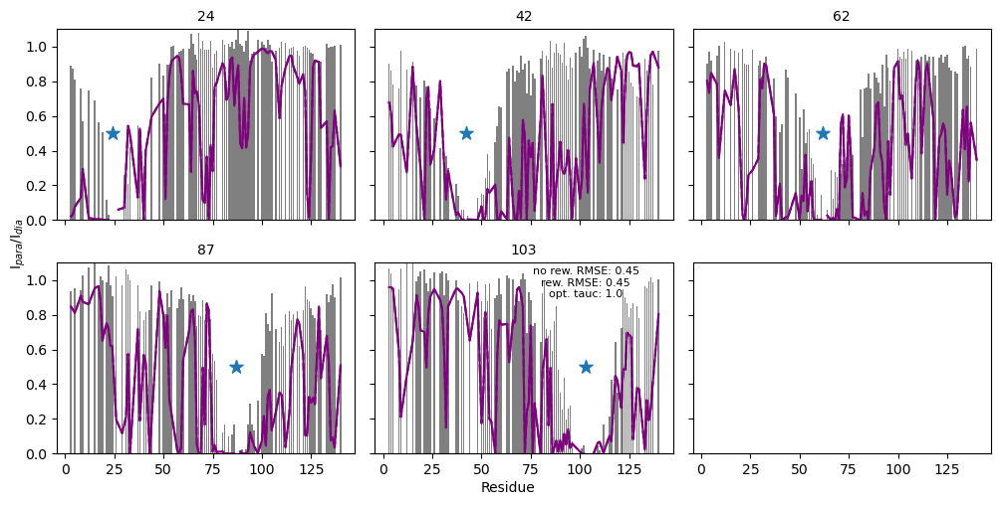

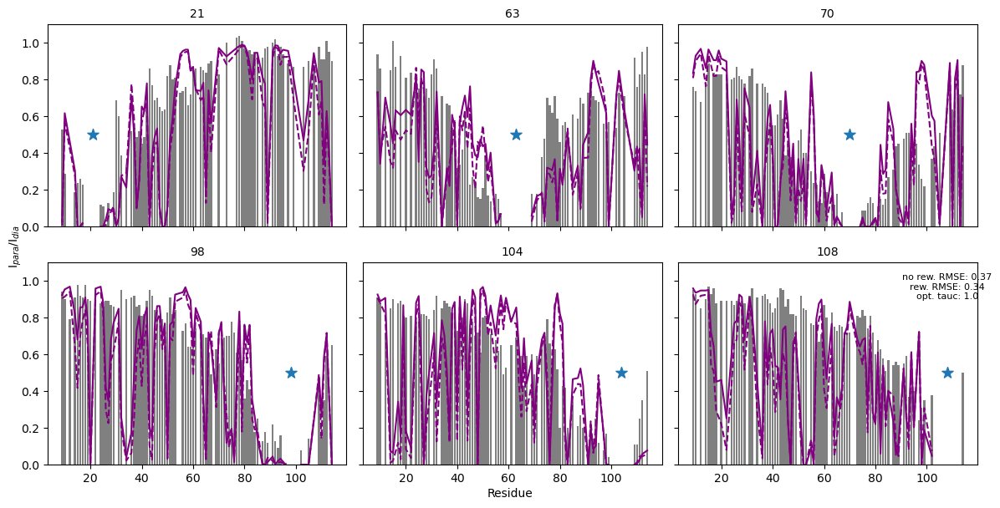

In [78]:
# plot

# plot all model and protein combinations and save in "pre_plots" folder

out_path = './PRE_plots/'
models = ['idpgan']


for model in models:
    for protein in ['aSyn', 'FLN5A3A3']:
        try:
            datadict=predict[model][protein]
        except:
            continue
        sites = []
        for key in list(datadict.keys()):
            try:
                S = int(key)
                sites.append(S)
            except:
                continue
        nsites = len(sites)
        # sort sites
        sites.sort()

        # Create subplots
        ncols = math.ceil(math.sqrt(nsites))
        nrows = math.ceil(nsites / ncols)
        fig, axes = plt.subplots(ncols=ncols, nrows=nrows, sharex=True, sharey=True, figsize=(nsites*2,nsites*1))
        axs = axes.ravel()
        
        for i, site in enumerate(sites):
            ax = axs[i]
            ax.set_title(site, fontsize = 10)

            ax.bar(datadict[site]['Residue'], datadict[site]['I_exp'], color = 'grey')
            # Split the data into two segments
            residues = datadict[site]['Residue']
            I_post = datadict[site]['I_gen_post']
            I_prior = datadict[site]['I_gen_prior']
            # Find first index where residue > site
            site_idx = next((i for i, r in enumerate(residues) if r > site), len(residues)-1)

            # Segment 1: before site (inclusive)
            res1 = residues[:site_idx]
            I_post1 = I_post[:site_idx]
            I_prior1 = I_prior[:site_idx]

            # Segment 2: after site
            res2 = residues[site_idx:]
            I_post2 = I_post[site_idx:]
            I_prior2 = I_prior[site_idx:]

            # Plot each segment separately
            ax.plot(res1, I_post1, color='purple', zorder=20)
            ax.plot(res2, I_post2, color='purple', zorder=20)

            ax.plot(res1, I_prior1, color='purple', linestyle='dashed', zorder=20)
            ax.plot(res2, I_prior2, color='purple', linestyle='dashed', zorder=20)

            if i==nsites-1:
                text_string = str("no rew. RMSE: {:.2f}\n".format(datadict['Prior RMSE'])) + str("rew. RMSE: {:.2f}\n".format(datadict['Post RMSE'])) + str("opt. tauc: {:.1f}".format(datadict['Post Opt TAUC']))
                ax.text(site, 0.9, text_string, ha='center', fontsize=8)

            ax.scatter(site, 0.5, s=100, marker="*")
            ax.set_ylim(0,1.1)

        # Set one master x and y label
        #fig.supxlabel('Residue', fontsize=10)
        #fig.supylabel('I$_{para}$/I$_{dia}$', fontsize=10)
        fig.text(0.5, -0.00, 'Residue', ha='center', fontsize=10)  # master x-label
        fig.text(-0.00, 0.5, 'I$_{para}$/I$_{dia}$', va='center', rotation='vertical', fontsize=10)  # master y-label
        plt.tight_layout()
       


